# Frequency Domain - Group Analysis
## ERSP, PSD, Topo, ITC

### ERSP
1. [done] All Subjects Average, for all Electrodes, for all Phases, for all Conditions. (overall feeling of data)
2. [done] All Trials Average, for all Electrodes, for all Phases, for all Conditions. (should be similar to 1.)
3. All Trials Average, for each Electrodes, for all Phases, for all Conditions. (breakdown for all Phases & Cond)
4. All Trials Average, for each Cluster, for all Phases, for all Conditions. (breakdown by Cluster)
5. All Trials Average, for each Cluster, for all Phases, for each Condition. (breakdown by Cluster x Cond)
6. All Trials Average, for each Cluster, for all Phases, for each Condition. (breakdown by Cluster x Cond)
7. All Trials Average, for each Cluster, for each Phase, for each Condition. (breakdown by Cluster x Phase x Cond)



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from tqdm import tqdm

import glob
import pickle
import time
import mne
from mne.time_frequency import tfr_morlet
from mne.stats import permutation_cluster_1samp_test

channels = ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 
       'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 
       'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 
       'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 
       'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']

# ERSP - For Each Subject: Save Power to File

In [64]:
#=============================================================================
# Main Loop - Loading Files 1 by 1 to Calculate Power (ERSP) & Save New File.
#=============================================================================
directory_path = '/Users/nick/Documents/PhD/CLCT/NeuroTracker/Frequency Full Report/'

freqs = np.arange(1, 50, 1)
n_cycles = freqs / 2.  # different number of cycle per frequency

for filepath in tqdm(glob.iglob(directory_path + 'Subject_*_cleanAR.pkl')):
    filename = filepath[filepath.rfind('/')+1:]
    tic = time.time()
    print(f'Loading: {filename}...')

    with open(filepath, "rb") as f:
        data_pickle = pickle.load(f)

        epochs = data_pickle['epochs']
        print('{} epochs loaded.'.format(len(epochs)))

        power = tfr_morlet(epochs.crop(tmin=-3, tmax=16), freqs=freqs, n_cycles=n_cycles, use_fft=True, return_itc=False, average=False, decim=8, n_jobs=8, verbose=False)
        
        # Try to clear memory. It shouldn't change anything as I am re-allocating that space, but can't be bad...
        del data_pickle
        del epochs
               
    with open(filename.replace("cleanAR","power"),"wb") as f:
        pickle.dump(power, f)
    
    toc = time.time()
    print('Done with: {} ({:.2f}s)...'.format(filename, toc-tic))


0it [00:00, ?it/s]

Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


1it [01:43, 103.11s/it]

Done with: Subject_T11F1_cleanAR.pkl (103.10s)...
Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


2it [02:53, 84.12s/it] 

Done with: Subject_T18M1_cleanAR.pkl (70.81s)...
Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


3it [03:57, 74.56s/it]

Done with: Subject_W10F2_cleanAR.pkl (63.17s)...
Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


4it [04:41, 62.75s/it]

Done with: Subject_T18F2_cleanAR.pkl (44.64s)...
Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


5it [05:47, 63.92s/it]

Done with: Subject_T16F2_cleanAR.pkl (65.98s)...
Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


6it [07:30, 77.10s/it]

Done with: Subject_T25F1_cleanAR.pkl (102.68s)...
Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


7it [09:02, 81.92s/it]

Done with: Subject_F12M1_cleanAR.pkl (91.83s)...
Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


8it [10:44, 88.31s/it]

Done with: Subject_W17M2_cleanAR.pkl (101.98s)...
Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


9it [11:57, 83.71s/it]

Done with: Subject_F12F2_cleanAR.pkl (73.59s)...
Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


10it [14:11, 99.16s/it]

Done with: Subject_S21F1_cleanAR.pkl (133.74s)...
Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


11it [16:09, 104.82s/it]

Done with: Subject_T23F1_cleanAR.pkl (117.62s)...
Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


12it [17:28, 96.93s/it] 

Done with: Subject_M22F2_cleanAR.pkl (78.86s)...
Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


13it [20:24, 120.85s/it]

Done with: Subject_M8M1_cleanAR.pkl (175.89s)...
Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


14it [21:58, 112.79s/it]

Done with: Subject_S20M1_cleanAR.pkl (94.16s)...
Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


15it [22:42, 92.18s/it] 

Done with: Subject_F19M1_cleanAR.pkl (44.39s)...
Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


16it [24:02, 88.46s/it]

Done with: Subject_T23F2_cleanAR.pkl (79.83s)...
Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


17it [25:04, 88.50s/it]

Done with: Subject_T9F2_cleanAR.pkl (62.08s)...


# Grand Average - Subject Average

Loading: Subject_M22F2_power.pkl...
Loading: Subject_T23F2_power.pkl...
Loading: Subject_T18F2_power.pkl...
Loading: Subject_T18M1_power.pkl...
Loading: Subject_S21F1_power.pkl...
Loading: Subject_S20M1_power.pkl...
Loading: Subject_M8M1_power.pkl...
Loading: Subject_F12M1_power.pkl...
Loading: Subject_F12F2_power.pkl...
Loading: Subject_F19M1_power.pkl...
Loading: Subject_W10F2_power.pkl...
Loading: Subject_T25F1_power.pkl...
Loading: Subject_W17M2_power.pkl...
Loading: Subject_T23F1_power.pkl...
Loading: Subject_T11F1_power.pkl...
Loading: Subject_T9F2_power.pkl...
Loading: Subject_T16F2_power.pkl...


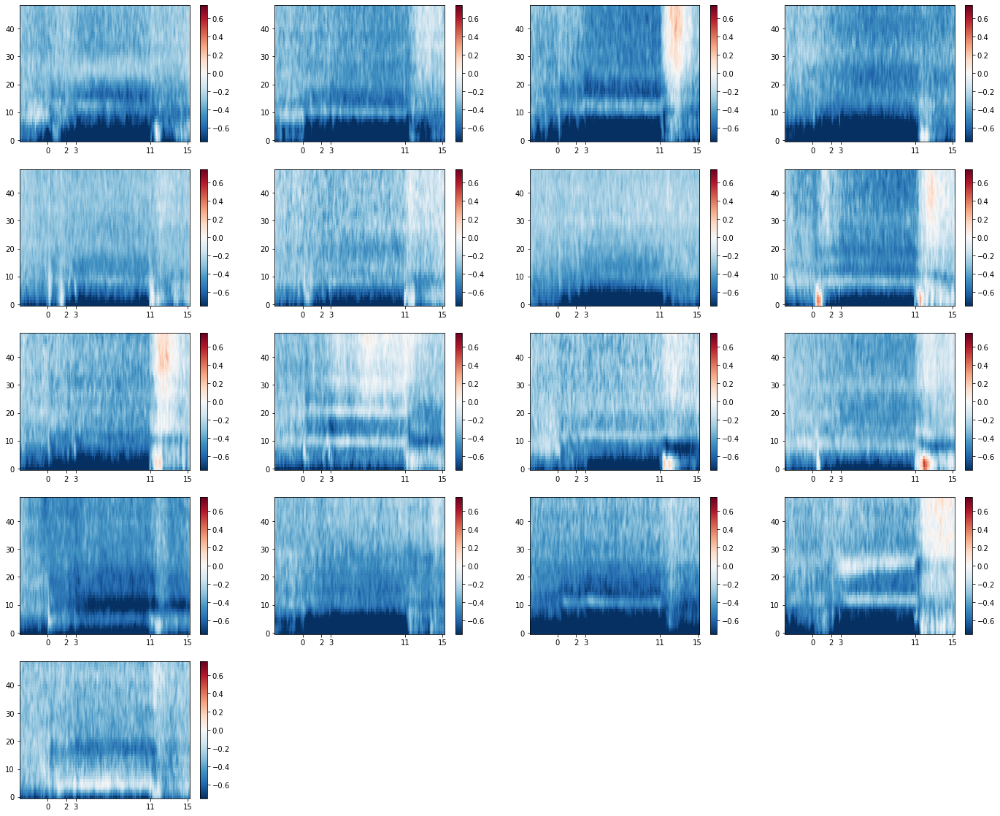

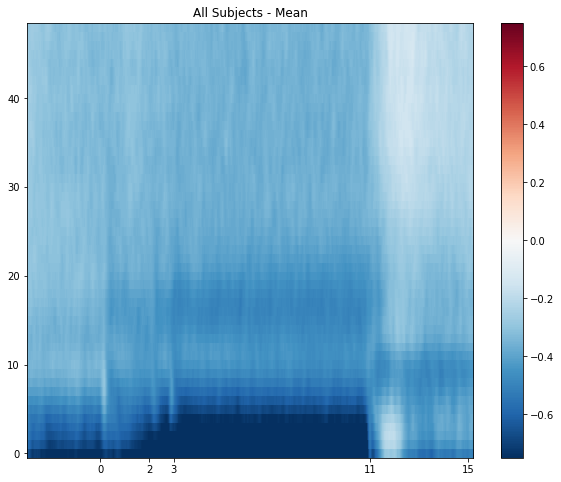

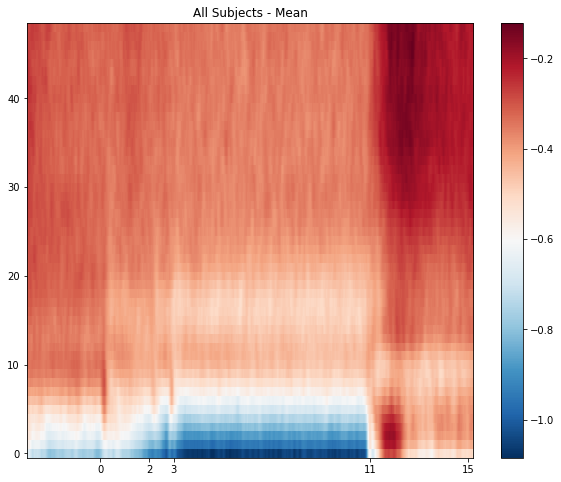

In [67]:
#===============================
# Main Loop - Loading All Files 
#===============================
directory_path = '/Users/nick/Documents/PhD/CLCT/NeuroTracker/Frequency Full Report/'

times = None
power2D_all = dict()
#power2D_trials = []

# Load files 1 by 1
for filepath in glob.iglob(directory_path + 'Subject_*_power.pkl'):
    filename = filepath[filepath.rfind('/')+1:]
    print(f'Loading: {filename}...')
    
    with open(filepath, "rb") as f:
        power = pickle.load(f)
        #print('{} power epochs loaded.'.format(len(power)))
        
        power = power.apply_baseline((-3,-2), mode='logratio', verbose=False)
        #print(power.data.shape)
        power2D_all[filename] = power.data.mean(0)
        
        if times is None:
            times = power.times
            
        del power
    
power2D_mean = np.array([])
power2D_stacked = []
for participant in power2D_all.keys():
    power2D_stacked.append(power2D_all[participant].mean(0))

power2D_stacked = np.stack(power2D_stacked)
power2D_mean = power2D_stacked #np.mean(power2D_stacked, 0)

ticks_offset = 0 #np.where(power.times > -1)[0][0]
times_of_interest = [0, 2, 3, 11, 15]
ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]
        
# Show Subject by Subject.
plt.figure(figsize=(24, 20))
for i in range(power2D_stacked.shape[0]):
    ax = plt.subplot(5, 4, i+1)
    z = ax.imshow(power2D_stacked[i, :,100:-100], cmap='RdBu_r', interpolation='nearest', aspect='auto', vmin=-0.75, vmax=0.75)
    ax.set_xticks(ticks_of_interest)
    ax.set_xticklabels(times_of_interest)
    ax.invert_yaxis()
    #ax.set_title('Subject')
    plt.colorbar(z, ax=ax)

plt.show()

# Show Group Average
fig, ax = plt.subplots(figsize=(10,8))
z = ax.imshow(power2D_mean.mean(0)[:,100:-100], cmap='RdBu_r', interpolation='nearest', aspect='auto', vmin=-0.75, vmax=0.75)
ax.set_xticks(ticks_of_interest)
ax.set_xticklabels(times_of_interest)
ax.invert_yaxis()
ax.set_title('All Subjects - Mean')
plt.colorbar(z, ax=ax)
plt.show()

# Show Group Average
fig, ax = plt.subplots(figsize=(10,8))
z = ax.imshow(power2D_mean.mean(0)[:,100:-100], cmap='RdBu_r', interpolation='nearest', aspect='auto')#, vmin=-0.75, vmax=0.75)
ax.set_xticks(ticks_of_interest)
ax.set_xticklabels(times_of_interest)
ax.invert_yaxis()
ax.set_title('All Subjects - Mean')
plt.colorbar(z, ax=ax)
plt.show()


# Grand Average - Trials Average

In [53]:
#===============================
# Main Loop - Loading All Files 
#===============================
directory_path = '/Users/nick/Documents/PhD/CLCT/NeuroTracker/Frequency Full Report/'

times = None
power2D_trials = []

for filepath in glob.iglob(directory_path + 'Subject_*_power.pkl'):
    filename = filepath[filepath.rfind('/')+1:]
    print(f'Loading: {filename}...')

    with open(filepath, "rb") as f:
        power = pickle.load(f)
        #print('{} power epochs loaded.'.format(len(power)))

        power = power.apply_baseline((-1,0), mode='logratio', verbose=False)
        for i in tqdm(range(len(power))):
            power2D_trials.append(power[i].data.mean(1))

        if times is None:
            times = power.times

        del power

Loading: Subject_M22F2_power.pkl...


100%|███████████████████████████████████████████████████████████████| 68/68 [00:00<00:00, 96.44it/s]


Loading: Subject_T23F2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 72/72 [00:00<00:00, 110.10it/s]


Loading: Subject_T18F2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 109.69it/s]


Loading: Subject_T18M1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 73/73 [00:00<00:00, 108.79it/s]


Loading: Subject_S21F1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 94/94 [00:00<00:00, 112.16it/s]


Loading: Subject_S20M1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 78/78 [00:00<00:00, 111.50it/s]


Loading: Subject_M8M1_power.pkl...


100%|█████████████████████████████████████████████████████████████| 104/104 [00:01<00:00, 80.65it/s]


Loading: Subject_F12M1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 76/76 [00:00<00:00, 111.28it/s]


Loading: Subject_F12F2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 70/70 [00:00<00:00, 110.44it/s]


Loading: Subject_F19M1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 110.45it/s]


Loading: Subject_W10F2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 67/67 [00:00<00:00, 110.59it/s]


Loading: Subject_T25F1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 111.12it/s]


Loading: Subject_W17M2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 83/83 [00:00<00:00, 111.93it/s]


Loading: Subject_T23F1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 80/80 [00:00<00:00, 111.78it/s]


Loading: Subject_T11F1_power.pkl...


100%|██████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 111.91it/s]


Loading: Subject_T9F2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 110.77it/s]


Loading: Subject_T16F2_power.pkl...


100%|██████████████████████████████████████████████████████████████| 69/69 [00:00<00:00, 111.63it/s]


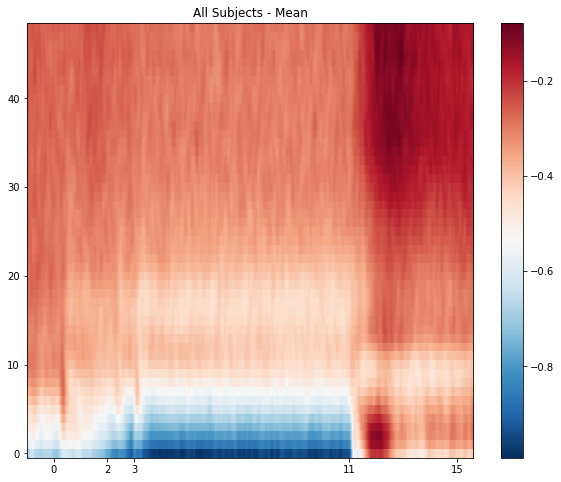

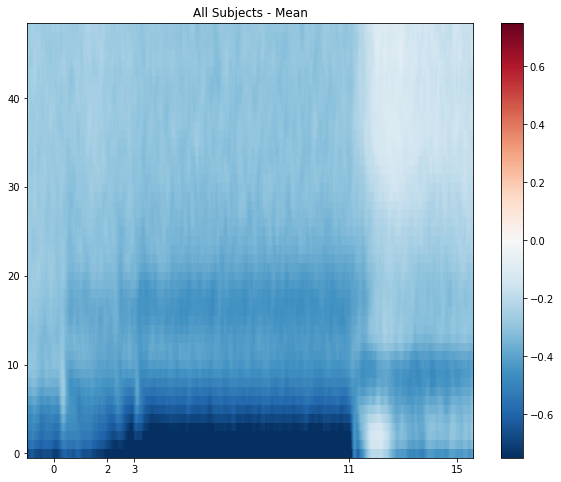

Doing t-test for Oz...


  0%|                                                                        | 0/49 [00:00<?, ?it/s]


IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

In [63]:
power2D_stacked = np.squeeze(np.stack(power2D_trials))
power2D_mean = np.mean(power2D_stacked, 0)

ticks_offset = 0 #np.where(power.times > -1)[0][0]
times_of_interest = [0, 2, 3, 11, 15]
ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]

# Show Trials Average - Across All Subjects (Group Level)
fig, ax = plt.subplots(figsize=(10,8))
z = ax.imshow(power2D_mean[:,50:-50], cmap='RdBu_r', interpolation='nearest', aspect='auto')#, vmin=-0.75, vmax=0.75)
ax.set_xticks(ticks_of_interest)
ax.set_xticklabels(times_of_interest)
ax.invert_yaxis()
ax.set_title('All Subjects - Mean')
plt.colorbar(z, ax=ax)
plt.show()

# Show Trials Average - Across All Subjects (Group Level)
fig, ax = plt.subplots(figsize=(10,8))
z = ax.imshow(power2D_mean[:,50:-50], cmap='RdBu_r', interpolation='nearest', aspect='auto', vmin=-0.75, vmax=0.75)
ax.set_xticks(ticks_of_interest)
ax.set_xticklabels(times_of_interest)
ax.invert_yaxis()
ax.set_title('All Subjects - Mean')
plt.colorbar(z, ax=ax)
plt.show()

#time_offset = (np.where(times >= 0)[0][0])
#pvals2D = np.zeros((49, 4353))
#print(f'Doing t-test for {ch}...')
#for freq in tqdm(range(0, 49)):
#    for time_id in range(time_offset, len(times)):
#        bl = power2D_mean[:, freq, 0:time_offset].flatten()
#        tf_point = power2D_mean[:, freq, time_id].flatten()
#        summary, pval = stats.ttest_ind(bl, tf_point)

#        pvals2D[freq-1, time_id-time_offset] = pval
    
#fig, ax = plt.subplots(figsize=(10,8))
#z = ax.imshow(pvals2D, cmap='RdBu_r', interpolation='nearest', aspect='auto', vmin=-0.75, vmax=0.75)
#ax.set_xticks(ticks_of_interest)
#ax.set_xticklabels(times_of_interest)
#ax.invert_yaxis()
#ax.set_title('All Subjects - Mean')
#plt.colorbar(z, ax=ax)
#plt.show()

# Function to Plot ERSP (S & G)

In [2]:
# Consts. (should be in cap)
phases = ['FS', 'ID', 'Tracking', 'Recall']
stimx = {'ID':0, 'Tracking':2, 'Recall':11, 'End':15}
key_times = {'ID':[0, 1], 'Tracking':[2, 3, 10], 'Recall':[11, 15], 'End': [15]}
phase_window = {'ID':(0, 2), 'Tracking':(2, 11), 'Recall':(11, 16), 'FS':(0, 16)}
times_phase = dict()

# Make Figure String
def get_report_fig_str(phase, setsize, side, perf, group=True):
    phase_str = phase if phase.lower() != 'all' else 'A'
    size_str = setsize if phase.lower() != 'all' else 'A'
    side_str = side[0].capitalize() if phase.lower() != 'all' else 'A'
    perf_str = perf[0].capitalize() if phase.lower() != 'all' else 'A'
    group_str = 'G' if group else 'S'
    fig_title = phase_str + ' [' + size_str + '|' + side_str + '|' + perf_str + '] - ' + group_str
    
    return fig_title

# Make Epoch String
def get_epoch_str(setsize='all', side='all', perf='all'):
    if setsize.lower() == 'all':
        setsize = ''
    if side.lower() == 'all' or side.lower() == 'both':
        side = ''
    if perf.lower() == 'all' or perf.lower() == 'both':
        perf = ''

    epoch_str = setsize

    if side != '':
        epoch_str = epoch_str + '/' + side if epoch_str != '' else side

    if perf != '':
        epoch_str = epoch_str + '/' + perf if epoch_str != '' else perf

    return epoch_str


def plot_ersp_from_files(phase, setsize, side, perf, electrodes, baseline): #, report, report_title=None):
    tmin,tmax = phase_window[phase]
    epoch_str = get_epoch_str(setsize, side, perf)

    #===============================
    # Main Loop - Loading All Files 
    #===============================
    directory_path = '/Users/nick/Documents/PhD/CLCT/NeuroTracker/Frequency Full Report/'

    times = None
    power2D_all = dict()

    # Load files 1 by 1
    for filepath in glob.iglob(directory_path + 'Subject_*_power.pkl'):
        filename = filepath[filepath.rfind('/')+1:]
        print(f'Loading: {filename}...')

        with open(filepath, "rb") as f:
            power = pickle.load(f)
            #print('{} power epochs loaded.'.format(len(power)))

            if epoch_str != "":
                power = power[epoch_str].pick_channels(electrodes).apply_baseline(baseline, mode='logratio', verbose=False).crop(tmin=tmin-1, tmax=tmax)
            else:
                power = power.pick_channels(electrodes).apply_baseline(baseline, mode='logratio', verbose=False).crop(tmin=tmin-1, tmax=tmax)
            #power = power.apply_baseline(baseline, mode='logratio', verbose=False).crop(tmin=tmin-1, tmax=tmax)
            power2D_all[filename] = power.data.mean(1) # Mean across channels (trials x channels x freq x time)

            if times is None:
                times = power.times

            del power

    power2D_mean = np.array([])
    power2D_stacked = []
    for participant in power2D_all.keys():
        power2D_stacked.append(power2D_all[participant].mean(0))

    power2D_stacked = np.stack(power2D_stacked)
    power2D_mean = power2D_stacked #np.mean(power2D_stacked, 0)

    ticks_offset = 100 #np.where(power.times > -1)[0][0]
    times_of_interest = key_times[phase] if phase != 'FS' else stimx.values()
    ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]

    # Show Subject by Subject.
    fig_subjs = plt.figure(figsize=(24, 20))
    for i in range(power2D_stacked.shape[0]):
        ax = plt.subplot(5, 4, i+1)
        z = ax.imshow(power2D_stacked[i, :,100:-100], cmap='RdBu_r', interpolation='nearest', aspect='auto', vmin=-0.75, vmax=0.75)
        ax.set_xticks(ticks_of_interest)
        ax.set_xticklabels(times_of_interest)
        ax.invert_yaxis()
        ax.set_title(list(power2D_all.keys())[i])
        plt.colorbar(z, ax=ax)
    #plt.show()

    # Show Group Average
    fig_group, ax = plt.subplots(figsize=(10,8))
    z = ax.imshow(power2D_mean.mean(0)[:,100:-100], cmap='RdBu_r', interpolation='nearest', aspect='auto')#, vmin=-0.75, vmax=0.75)
    ax.set_xticks(ticks_of_interest)
    ax.set_xticklabels(times_of_interest)
    ax.invert_yaxis()
    ax.set_title('Group Average')
    plt.colorbar(z, ax=ax)
    #plt.show()
    
    return fig_subjs, fig_group

# All Channels (Whole Head) - Report

In [4]:
report_group = mne.Report(title='[Exploratory] Group Report - All Channels - Frequency 1-50Hz')
report_group_filename = 'Group Report - All Channels - Frequency 1-50Hz.html'
report = report_group

electrodes = channels
baseline = (-1, 0)
for cur_phase in phases:
    print(f"Doing Phase: {cur_phase}...")
    
    setsize = 'all'
    side = 'all'
    for perf in ['good', 'bad']:
        fig_subjs, fig_group = plot_ersp_from_files(cur_phase, setsize, side, perf, electrodes, baseline)

        if report is not None:
            title_str = get_report_fig_str(cur_phase, setsize, side, perf, group=False)
            report.add_figure(
            fig=fig_subjs, title=title_str,
            caption=title_str,
            tags=('ERSP',cur_phase,),
            image_format='PNG')

        if report is not None:
            title_str = get_report_fig_str(cur_phase, setsize, side, perf, group=True)
            report.add_figure(
            fig=fig_group, title=title_str,
            caption=title_str,
            tags=('ERSP',cur_phase,),
            image_format='PNG')

    perf = 'good'
    side = 'all'
    for setsize in ['1', '2', '3']:
        fig_subjs, fig_group = plot_ersp_from_files(cur_phase, setsize, side, perf, electrodes, baseline)

        if report is not None:
            title_str = get_report_fig_str(cur_phase, setsize, side, perf, group=False)
            report.add_figure(
            fig=fig_subjs, title=title_str,
            caption=title_str,
            tags=('ERSP',cur_phase,),
            image_format='PNG')

        if report is not None:
            title_str = get_report_fig_str(cur_phase, setsize, side, perf, group=True)
            report.add_figure(
            fig=fig_group, title=title_str,
            caption=title_str,
            tags=('ERSP',cur_phase,),
            image_format='PNG')
            
print('Saving report...')
report_group.save(report_group_filename, overwrite=True, open_browser=True)

Embedding : jquery-3.6.0.min.js
Embedding : bootstrap.bundle.min.js
Embedding : bootstrap.min.css
Embedding : highlightjs/highlight.min.js
Embedding : highlightjs/atom-one-dark-reasonable.min.css
Doing Phase: FS...
Loading: Subject_M22F2_power.pkl...
Loading: Subject_T23F2_power.pkl...
Loading: Subject_T18F2_power.pkl...
Loading: Subject_T18M1_power.pkl...
Loading: Subject_S21F1_power.pkl...
Loading: Subject_S20M1_power.pkl...
Loading: Subject_M8M1_power.pkl...
Loading: Subject_F12M1_power.pkl...
Loading: Subject_F12F2_power.pkl...
Loading: Subject_F19M1_power.pkl...
Loading: Subject_W10F2_power.pkl...
Loading: Subject_T25F1_power.pkl...
Loading: Subject_W17M2_power.pkl...
Loading: Subject_T23F1_power.pkl...
Loading: Subject_T11F1_power.pkl...
Loading: Subject_T9F2_power.pkl...
Loading: Subject_T16F2_power.pkl...
Loading: Subject_M22F2_power.pkl...
Loading: Subject_T23F2_power.pkl...
Loading: Subject_T18F2_power.pkl...
Loading: Subject_T18M1_power.pkl...
Loading: Subject_S21F1_power.pk

Loading: Subject_T23F2_power.pkl...
Loading: Subject_T18F2_power.pkl...
Loading: Subject_T18M1_power.pkl...
Loading: Subject_S21F1_power.pkl...
Loading: Subject_S20M1_power.pkl...
Loading: Subject_M8M1_power.pkl...
Loading: Subject_F12M1_power.pkl...
Loading: Subject_F12F2_power.pkl...
Loading: Subject_F19M1_power.pkl...
Loading: Subject_W10F2_power.pkl...
Loading: Subject_T25F1_power.pkl...
Loading: Subject_W17M2_power.pkl...
Loading: Subject_T23F1_power.pkl...
Loading: Subject_T11F1_power.pkl...
Loading: Subject_T9F2_power.pkl...
Loading: Subject_T16F2_power.pkl...
Loading: Subject_M22F2_power.pkl...
Loading: Subject_T23F2_power.pkl...
Loading: Subject_T18F2_power.pkl...
Loading: Subject_T18M1_power.pkl...
Loading: Subject_S21F1_power.pkl...
Loading: Subject_S20M1_power.pkl...
Loading: Subject_M8M1_power.pkl...
Loading: Subject_F12M1_power.pkl...
Loading: Subject_F12F2_power.pkl...
Loading: Subject_F19M1_power.pkl...
Loading: Subject_W10F2_power.pkl...
Loading: Subject_T25F1_power.pk

'/Users/nick/Documents/PhD/CLCT/NeuroTracker/Frequency Full Report/Group Report - All Channels - Frequency 1-50Hz.html'

# Clusters - Report

In [ ]:
clusters = dict()
clusters['MidLine'] = ['Fpz', 'AFz', 'Fz', 'FCz', 'Cz', 'CPz', 'Pz',  'POz', 'Oz'] # Do also 1 by one. Interesting.
clusters['Frontal'] = ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'Fpz', 
                       'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8']
clusters['Central']  = ['C1', 'C3', 'C5', 'C2', 'C4', 'C6', 'Cz', 'CP5', 'CP3', 'CP1', 
                        'CPz', 'CP6', 'CP4', 'CP2', 'FC5', 'FC3', 'FC1', 'FC6', 'FC4', 'FC2']
clusters['Temporal'] = ['FT7', 'T7', 'TP7', 'FT8', 'T8', 'TP8']
clusters['Parietal'] = ['TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 
                        'POz', 'Pz', 'CPz', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4']
clusters['Occipital'] = ['O1', 'Oz', 'POz','O2']

cluster_names = list(clusters.keys())
    
for clname in cluster_names:
    lat_channels = [ch for ch in clusters[clname] if ch[-1] != 'z']
    
    if len(lat_channels):
        # --- Left Side ---
        clside = 'Left'
        new_key = clname + '-' + clside
        clusters[new_key] = [ch for ch in lat_channels if int(ch[-1]) % 2 == 1]

        # --- Right Side ---
        clside = 'Right'
        new_key = clname + '-' + clside
        clusters[new_key] = [ch for ch in lat_channels if int(ch[-1]) % 2 == 0]
    
clusters

report_group = mne.Report(title='[Exploratory] Group Report - All Channels - Frequency 1-50Hz')
report_group_filename = 'Group Report - All Chs - Freq 1-50Hz.html'
report = report_group

electrodes = channels
baseline = (-1, 0)

perf = 'good'
side = 'all'
for cluster in clusters:
    print(f"Doing Cluster: {cluster}...")
    
    for setsize in ['1', '2', '3']:
        fig_subjs, fig_group = plot_ersp_from_files(cur_phase, setsize, side, perf, electrodes, baseline)

        if report is not None:
            title_str = get_report_fig_str(cur_phase, setsize, side, perf, group=False)
            report.add_figure(
            fig=fig_subjs, title=title_str,
            caption=title_str,
            tags=('ERSP',cur_phase,),
            image_format='PNG')

        if report is not None:
            title_str = get_report_fig_str(cur_phase, setsize, side, perf, group=True)
            report.add_figure(
            fig=fig_group, title=title_str,
            caption=title_str,
            tags=('ERSP',cur_phase,),
            image_format='PNG')
            
    
            
print('Saving report...')
report_group.save(report_group_filename, overwrite=True, open_browser=True)

    
# FOR EACH CLUSTER - SAVE GROUP PICTURE - CREATE NEW SECTION WITH ALL FIGURES NEXT TO ONE ANOTHER? 
# GET VALUES?!

# Cluster Stats

https://mne.tools/stable/auto_tutorials/stats-sensor-space/50_cluster_between_time_freq.html

# Frequency per Channel

In [3]:
import scipy.stats as stats
from tqdm import tqdm

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
directory_path = '/Users/nick/Documents/PhD/CLCT/NeuroTracker/Frequency Full Report/'

freqs = np.arange(1, 50, 1)
n_cycles = freqs / 2.  # different number of cycle per frequency

for ch in channels:
    power2D_raw_trials = []
    power2D_blratio_trials = []

    print('=======================')
    print(f'Doing Channel: {ch}')
    print('=======================')
    for filepath in glob.iglob(directory_path + 'Subject_*_cleanAR.pkl'):
        filename = filepath[filepath.rfind('/')+1:]
        print(f'Loading: {filename}...')

        with open(filepath, "rb") as f:
            data_pickle = pickle.load(f)

            epochs = data_pickle['epochs']
            raw = data_pickle['raw']
            events = data_pickle['events']
            print('{} epochs loaded.'.format(len(epochs)))

            for i in tqdm(range(len(epochs))):
                power = tfr_morlet(epochs[i].pick_channels([ch]), freqs=freqs, n_cycles=n_cycles, use_fft=True, return_itc=False, decim=8, n_jobs=5, verbose=False)
                cur_raw_power2D = power.data[:,:, (power.times > -1) & (power.times < 16)].mean(0)
                blratio_power = power.apply_baseline((-1,0), mode='logratio', verbose=False)
                cur_blratio_power2D = blratio_power.data[:,:, (power.times > -1) & (power.times < 16)].mean(0)

                power2D_raw_trials.append(cur_raw_power2D)
                power2D_blratio_trials.append(cur_blratio_power2D)

            # Try to clear memory. It shouldn't change anything as I am re-allocating that space, but can't be bad...
            del data_pickle
            del epochs
            del raw
            del events
            
    stacked_power2D_raw = np.stack(power2D_raw_trials)
    stacked_power2D_blratio = np.stack(power2D_blratio_trials)
    times = power.times[(power.times > -1) & (power.times < 16)]
    time_offset = (np.where(times >= 0)[0][0])
    
    pvals2D = np.zeros((49, 4096))
    print(f'Doing t-test for {ch}...')
    for freq in tqdm(range(0, 49)):
        for time_id in range(time_offset, len(times)):
            bl = stacked_power2D_raw[:, freq, 0:time_offset].flatten()
            tf_point = stacked_power2D_raw[:, freq, time_id].flatten()
            summary, pval = stats.ttest_ind(bl, tf_point)

            pvals2D[freq-1, time_id-time_offset] = pval
    print('Done!')
        
    with open(f"power2D_trials_{ch}.pkl","wb") as f:
        data_pickle = dict()
        data_pickle["times"] = times
        data_pickle["power2D_pvals"] = pvals2D
        data_pickle["power2D_blratio_mean"] = stacked_power2D_blratio.mean(0)
        pickle.dump(data_pickle, f)
        

Doing Channel: Fp1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:10<00:00,  7.54it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.73it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:06<00:00,  9.69it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.72it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  9.77it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:08<00:00,  9.43it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.32it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:08<00:00,  9.34it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  9.19it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.72it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:08<00:00,  9.10it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  9.36it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.12it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.90it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  9.40it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.65it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  9.03it/s]


Doing t-test for Fp1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: AF7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:10<00:00,  7.63it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.27it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.37it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.47it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  9.10it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.85it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.91it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.92it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.85it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.90it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:08<00:00,  9.18it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  9.03it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.92it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.93it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  9.04it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.70it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.61it/s]


Doing t-test for AF7...


100%|███████████████████████████████████████████████████████████████| 49/49 [07:34<00:00,  9.28s/it]


Done!
Doing Channel: AF3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.87it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.93it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.96it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.96it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.67it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.83it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.87it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.99it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.88it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.70it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.72it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.83it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.87it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.89it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.93it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.91it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.81it/s]


Doing t-test for AF3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.93s/it]


Done!
Doing Channel: F1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  7.15it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.95it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.32it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.13it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.96it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.02it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.04it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.51it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.67it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.57it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.56it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.57it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.99it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.89it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.77it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.89it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.82it/s]


Doing t-test for F1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.93s/it]


Done!
Doing Channel: F3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.65it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.93it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.69it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.82it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.63it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.77it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.53it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.77it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.79it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.85it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.85it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.93it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.73it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.52it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.49it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.61it/s]


Doing t-test for F3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.87s/it]


Done!
Doing Channel: F5
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.75it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.83it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.92it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.25it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.90it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.02it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.87it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.96it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.80it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.38it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.58it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.61it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.73it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.63it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.89it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.79it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  9.00it/s]


Doing t-test for F5...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: F7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.98it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.99it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.13it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.02it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.59it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.53it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:09<00:00,  8.34it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.52it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.44it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.79it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.71it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.75it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.83it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.81it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.70it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.55it/s]


Doing t-test for F7...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: FT7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.74it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.73it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.73it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.65it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.60it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.96it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.72it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.74it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.75it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.67it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.45it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.49it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.41it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.57it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.62it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.71it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.82it/s]


Doing t-test for FT7...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.88s/it]


Done!
Doing Channel: FC5
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.98it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.05it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.11it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.08it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  9.08it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.82it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.77it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.86it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.76it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.68it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.76it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.73it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.76it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.78it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.79it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.79it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.35it/s]


Doing t-test for FC5...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: FC3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.98it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.53it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.74it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.58it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.59it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.77it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.67it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.70it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.77it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.97it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.70it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.72it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.39it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.25it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.45it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.55it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.38it/s]


Doing t-test for FC3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.92s/it]


Done!
Doing Channel: FC1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.75it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.94it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.01it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.96it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.82it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.85it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.74it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.77it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.69it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.77it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.65it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.81it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.60it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.82it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.84it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.82it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.79it/s]


Doing t-test for FC1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: C1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.96it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.05it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.96it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.74it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.53it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.59it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:09<00:00,  8.31it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.50it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.75it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.94it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.78it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.77it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.71it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.34it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.44it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.49it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.19it/s]


Doing t-test for C1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: C3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.70it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.76it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.56it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.80it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.73it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.95it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.66it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.68it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.69it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.42it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.55it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.47it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.40it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.61it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.76it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.78it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.61it/s]


Doing t-test for C3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:53<00:00,  7.22s/it]


Done!
Doing Channel: C5
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.69it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.61it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.76it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.81it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.64it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.66it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:09<00:00,  8.36it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:10<00:00,  8.14it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.46it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.67it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.47it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.42it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.39it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.45it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.37it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.32it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.17it/s]


Doing t-test for C5...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:59<00:00,  7.33s/it]


Done!
Doing Channel: T7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.94it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.01it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.95it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.05it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.89it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.83it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.85it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.41it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.54it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.49it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.57it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.63it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.98it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.93it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.92it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.78it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.52it/s]


Doing t-test for T7...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.88s/it]


Done!
Doing Channel: TP7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  7.08it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.09it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.84it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.93it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.67it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.77it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.55it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.88it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.85it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.84it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.79it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.86it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.74it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.58it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.53it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.57it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.63it/s]


Doing t-test for TP7...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:40<00:00,  6.95s/it]


Done!
Doing Channel: CP5
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.85it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.85it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.06it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.01it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  9.01it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.98it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.80it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.84it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.49it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.65it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.50it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.59it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.78it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.95it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.88it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.92it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.70it/s]


Doing t-test for CP5...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.88s/it]


Done!
Doing Channel: CP3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.97it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.15it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.96it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.06it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.61it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.69it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.57it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.56it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.57it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.99it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.89it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.90it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.07it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.87it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.57it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.43it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.62it/s]


Doing t-test for CP3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: CP1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.74it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.89it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.82it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.71it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.93it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.96it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.03it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.84it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.77it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.40it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.52it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.57it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.77it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.60it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.90it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.94it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.64it/s]


Doing t-test for CP1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: P1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.92it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.99it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.96it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.08it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.95it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.59it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.77it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.65it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.51it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.66it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.84it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.90it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.94it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.87it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.96it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.67it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.66it/s]


Doing t-test for P1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: P3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.73it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.74it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.90it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.78it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.64it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.83it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.02it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.98it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.80it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.96it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.67it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.44it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.73it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.57it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.66it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.66it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  9.00it/s]


Doing t-test for P3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.92s/it]


Done!
Doing Channel: P5
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.87it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.05it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.11it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.28it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.94it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.96it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.71it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.67it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.43it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.52it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.50it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.84it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.85it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.95it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.97it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.92it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.84it/s]


Doing t-test for P5...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: P7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.97it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.58it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.85it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.73it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.57it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.59it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:09<00:00,  8.44it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.74it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.59it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.93it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.79it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.77it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.47it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.72it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.50it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.68it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.56it/s]


Doing t-test for P7...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.88s/it]


Done!
Doing Channel: P9
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.70it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.09it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.09it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.84it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.99it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.87it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.81it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.80it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.52it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.73it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.61it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.65it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.99it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.92it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.89it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.98it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.61it/s]


Doing t-test for P9...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.88s/it]


Done!
Doing Channel: PO7
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.98it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.06it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.22it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.74it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.65it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.67it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.61it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.53it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.66it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.68it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.84it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.71it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.90it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.59it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.52it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.31it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.49it/s]


Doing t-test for PO7...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:40<00:00,  6.94s/it]


Done!
Doing Channel: PO3
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  7.00it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.18it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.09it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.20it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.95it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.96it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.91it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.84it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.76it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.38it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.47it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.58it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.81it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.83it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.92it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.95it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.72it/s]


Doing t-test for PO3...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.92s/it]


Done!
Doing Channel: O1
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.88it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.67it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.11it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.13it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.64it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.65it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.58it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.60it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.33it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.76it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.82it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.79it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.89it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.86it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.29it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.57it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.73it/s]


Doing t-test for O1...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:34<00:00,  6.83s/it]


Done!
Doing Channel: Iz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.91it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.38it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.02it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.16it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.91it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.06it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.99it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.75it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.81it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.85it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.26it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.45it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.69it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.56it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.54it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.87it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.69it/s]


Doing t-test for Iz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: Oz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.85it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.26it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.12it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.27it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.99it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.90it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.62it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.56it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.31it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.42it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.71it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.89it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.01it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.96it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.91it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.97it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.55it/s]


Doing t-test for Oz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: POz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.73it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.80it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.96it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.87it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.66it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.69it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.95it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.69it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.80it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.88it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.74it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.46it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.82it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.60it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.64it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.40it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.61it/s]


Doing t-test for POz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.90s/it]


Done!
Doing Channel: Pz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.95it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.31it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.17it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.15it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.95it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.04it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.99it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.55it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.65it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.40it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.48it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.61it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.91it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.97it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.86it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.77it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.67it/s]


Doing t-test for Pz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.93s/it]


Done!
Doing Channel: CPz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.91it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.60it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.87it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.76it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.62it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.58it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.59it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.86it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.89it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  9.01it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.80it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.84it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.60it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.64it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.49it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.53it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.47it/s]


Doing t-test for CPz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.90s/it]


Done!
Doing Channel: Fpz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.70it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.83it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.04it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.29it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.97it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.87it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.02it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.70it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.52it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.47it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.51it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.58it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.91it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.84it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.87it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.86it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.87it/s]


Doing t-test for Fpz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:40<00:00,  6.95s/it]


Done!
Doing Channel: Fp2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.87it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.93it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.03it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.94it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.72it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.75it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.59it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.58it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.75it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.69it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.77it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.72it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.77it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.44it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.55it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.39it/s]


Doing t-test for Fp2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.90s/it]


Done!
Doing Channel: AF8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.72it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.00it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.81it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.04it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  9.00it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.00it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.00it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.93it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.86it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.33it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.45it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.46it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.74it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.67it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.82it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.86it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.74it/s]


Doing t-test for AF8...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.92s/it]


Done!
Doing Channel: AF4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.92it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.73it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.17it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.13it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.66it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.75it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.55it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.62it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.44it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.71it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.77it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.94it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.85it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.56it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.50it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.54it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.53it/s]


Doing t-test for AF4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: AFz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.71it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.97it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.57it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.87it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.66it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.91it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.97it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.85it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.74it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.62it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.45it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.65it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.69it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.58it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.51it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.85it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.86it/s]


Doing t-test for AFz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.87s/it]


Done!
Doing Channel: Fz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.94it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.18it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.24it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.45it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.98it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.94it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.75it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.63it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.52it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.58it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.64it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.80it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.07it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.86it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.95it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.82it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.44it/s]


Doing t-test for Fz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: F2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.75it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.77it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.86it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.94it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.49it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.67it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.99it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.83it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.81it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.88it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.77it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.63it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.80it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.65it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.52it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.68it/s]


Doing t-test for F2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: F4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.67it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.92it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.39it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.19it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.95it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.05it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.92it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.59it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.57it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.61it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.59it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.62it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.03it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.87it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.88it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.82it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.64it/s]


Doing t-test for F4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.92s/it]


Done!
Doing Channel: F6
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.87it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.89it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.78it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.94it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.62it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.57it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.68it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.68it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.78it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.78it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.65it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.75it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.71it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.59it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.57it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.43it/s]


Doing t-test for F6...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.86s/it]


Done!
Doing Channel: F8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.64it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.83it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.84it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.11it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.77it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.96it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.79it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.77it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.62it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.29it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.50it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.57it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.73it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.74it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.76it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.85it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.72it/s]


Doing t-test for F8...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:40<00:00,  6.95s/it]


Done!
Doing Channel: FT8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.86it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.20it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.09it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.94it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.75it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.73it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.59it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.50it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.54it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.71it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.71it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.75it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.93it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.79it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.95it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.89it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.90it/s]


Doing t-test for FT8...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: FC6
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.67it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.79it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.89it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.88it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.93it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.85it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.02it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.85it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.77it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.55it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.45it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.50it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.82it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.63it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.80it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.89it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  9.00it/s]


Doing t-test for FC6...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.87s/it]


Done!
Doing Channel: FC4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.92it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.95it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.22it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.32it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.72it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.70it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.80it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.49it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.60it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.53it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.75it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.79it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.02it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.84it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.81it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.58it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.65it/s]


Doing t-test for FC4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: FC2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.63it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.82it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.77it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.91it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.65it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.75it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.99it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.76it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.80it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.78it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.52it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.54it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.78it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.63it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.58it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.76it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.64it/s]


Doing t-test for FC2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.87s/it]


Done!
Doing Channel: FCz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.89it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.27it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.04it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.26it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.91it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.00it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.68it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.61it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.55it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.41it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.38it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.91it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.82it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.86it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.87it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.88it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.62it/s]


Doing t-test for FCz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.93s/it]


Done!
Doing Channel: Cz
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.86it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.64it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.73it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.85it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.62it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.68it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.79it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.89it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.77it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.91it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.88it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.71it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.59it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.59it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.55it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.58it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.40it/s]


Doing t-test for Cz...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.88s/it]


Done!
Doing Channel: C2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.67it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.01it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.03it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.11it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.93it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.98it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.89it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.63it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.63it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.42it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.46it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.57it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.96it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.79it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.81it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.85it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.80it/s]


Doing t-test for C2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.93s/it]


Done!
Doing Channel: C4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.89it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.08it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.74it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.91it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.67it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.57it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.68it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.67it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.62it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.68it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.74it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.79it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.75it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.56it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.60it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.63it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.53it/s]


Doing t-test for C4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: C6
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.66it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.66it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.80it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.06it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.84it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.95it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.86it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.94it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.60it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.39it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.51it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.62it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.66it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.84it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.94it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.95it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.89it/s]


Doing t-test for C6...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: T8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.91it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:07<00:00,  9.27it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.09it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.09it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.65it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.68it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.76it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.69it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.45it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.69it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:08<00:00,  8.92it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.79it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.02it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.91it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.47it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.59it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.55it/s]


Doing t-test for T8...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:40<00:00,  6.95s/it]


Done!
Doing Channel: TP8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:12<00:00,  6.58it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.55it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.80it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.97it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.83it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.91it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.80it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.73it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.70it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.74it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.51it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.45it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.74it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.44it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.81it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.91it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.82it/s]


Doing t-test for TP8...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.89s/it]


Done!
Doing Channel: CP6
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.81it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  9.00it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.11it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.16it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.84it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.68it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.68it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.68it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.48it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.50it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.62it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.74it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.93it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.87it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.84it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.37it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.57it/s]


Doing t-test for CP6...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: CP4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.65it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.86it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.72it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.90it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.61it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.91it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.98it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.85it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.69it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.82it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.53it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.43it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.56it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.59it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.63it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.80it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.87it/s]


Doing t-test for CP4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.93s/it]


Done!
Doing Channel: CP2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.82it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.68it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.10it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.03it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.89it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.89it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.60it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.61it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.45it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.58it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.46it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.84it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.82it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.88it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.89it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.86it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.46it/s]


Doing t-test for CP2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:36<00:00,  6.87s/it]


Done!
Doing Channel: P2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.83it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.80it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.80it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.75it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.51it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.55it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.91it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.92it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.68it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.70it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.85it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.72it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.55it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.53it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.58it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.50it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.50it/s]


Doing t-test for P2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.94s/it]


Done!
Doing Channel: P4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.65it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.97it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.15it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.35it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.94it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.01it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.79it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.45it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.54it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.51it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.28it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.48it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  9.04it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.84it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.93it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.91it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.34it/s]


Doing t-test for P4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:37<00:00,  6.88s/it]


Done!
Doing Channel: P6
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.78it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.70it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.73it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.90it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.59it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.62it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.54it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.64it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.63it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.49it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.79it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:07<00:00,  8.60it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.55it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.59it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.60it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.59it/s]


Doing t-test for P6...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:39<00:00,  6.92s/it]


Done!
Doing Channel: P8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.61it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.92it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.18it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.22it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  8.97it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.94it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.95it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.96it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.54it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:11<00:00,  8.49it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.51it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.33it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.79it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:08<00:00,  8.72it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:05<00:00,  8.93it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.91it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.81it/s]


Doing t-test for P8...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:40<00:00,  6.95s/it]


Done!
Doing Channel: P10
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.80it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.97it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  9.00it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  8.80it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.59it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  8.71it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  8.57it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.50it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:08<00:00,  8.53it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.79it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.70it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.42it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:11<00:00,  8.69it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.43it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.53it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.56it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  8.50it/s]


Doing t-test for P10...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:38<00:00,  6.91s/it]


Done!
Doing Channel: PO8
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:11<00:00,  6.67it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:08<00:00,  8.75it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:07<00:00,  8.89it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:05<00:00,  9.15it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:07<00:00,  9.06it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:09<00:00,  9.13it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:08<00:00,  9.03it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:09<00:00,  8.80it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:07<00:00,  8.84it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:10<00:00,  8.61it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:09<00:00,  8.43it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:08<00:00,  8.34it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:12<00:00,  8.53it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:09<00:00,  8.52it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:06<00:00,  8.77it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:08<00:00,  8.88it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:06<00:00,  9.01it/s]


Doing t-test for PO8...


100%|███████████████████████████████████████████████████████████████| 49/49 [10:07<00:00, 12.39s/it]


Done!
Doing Channel: PO4
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [05:08<00:00,  3.91s/it]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:13<00:00,  5.58it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:10<00:00,  6.31it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [02:59<00:00,  3.66s/it]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  7.76it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:13<00:00,  6.41it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:11<00:00,  6.58it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [09:02<00:00,  6.53s/it]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:10<00:00,  6.81it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:12<00:00,  7.32it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:12<00:00,  6.38it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:09<00:00,  7.25it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:14<00:00,  7.36it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:13<00:00,  5.68it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:10<00:00,  5.23it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:11<00:00,  6.03it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:09<00:00,  6.05it/s]


Doing t-test for PO4...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:30<00:00,  6.74s/it]


Done!
Doing Channel: O2
Loading: Subject_T11F1_cleanAR.pkl...
79 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 79/79 [00:18<00:00,  4.32it/s]


Loading: Subject_T18M1_cleanAR.pkl...
73 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 73/73 [00:11<00:00,  6.29it/s]


Loading: Subject_W10F2_cleanAR.pkl...
67 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 67/67 [00:10<00:00,  6.11it/s]


Loading: Subject_T18F2_cleanAR.pkl...
49 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 49/49 [00:08<00:00,  5.97it/s]


Loading: Subject_T16F2_cleanAR.pkl...
69 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 69/69 [00:08<00:00,  8.03it/s]


Loading: Subject_T25F1_cleanAR.pkl...
84 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 84/84 [00:13<00:00,  6.33it/s]


Loading: Subject_F12M1_cleanAR.pkl...
76 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 76/76 [00:11<00:00,  6.56it/s]


Loading: Subject_W17M2_cleanAR.pkl...
83 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 83/83 [00:11<00:00,  6.97it/s]


Loading: Subject_F12F2_cleanAR.pkl...
70 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 70/70 [00:10<00:00,  6.64it/s]


Loading: Subject_S21F1_cleanAR.pkl...
94 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 94/94 [00:13<00:00,  6.93it/s]


Loading: Subject_T23F1_cleanAR.pkl...
80 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 80/80 [00:13<00:00,  6.08it/s]


Loading: Subject_M22F2_cleanAR.pkl...
68 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 68/68 [00:10<00:00,  6.38it/s]


Loading: Subject_M8M1_cleanAR.pkl...
104 epochs loaded.


100%|█████████████████████████████████████████████████████████████| 104/104 [00:15<00:00,  6.80it/s]


Loading: Subject_S20M1_cleanAR.pkl...
78 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 78/78 [00:13<00:00,  5.64it/s]


Loading: Subject_F19M1_cleanAR.pkl...
53 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 53/53 [00:09<00:00,  5.49it/s]


Loading: Subject_T23F2_cleanAR.pkl...
72 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 72/72 [00:10<00:00,  6.82it/s]


Loading: Subject_T9F2_cleanAR.pkl...
57 epochs loaded.


100%|███████████████████████████████████████████████████████████████| 57/57 [00:08<00:00,  7.01it/s]


Doing t-test for O2...


100%|███████████████████████████████████████████████████████████████| 49/49 [05:33<00:00,  6.81s/it]

Done!


Loading: power2D_trials_P1.pkl...


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_20750/1765512994.py:28: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar(y)


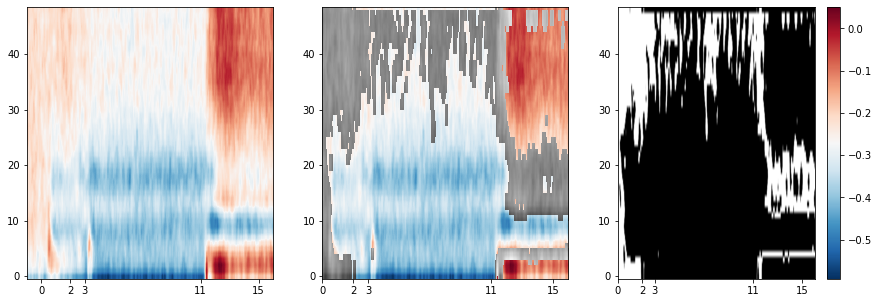

Loading: power2D_trials_FCz.pkl...


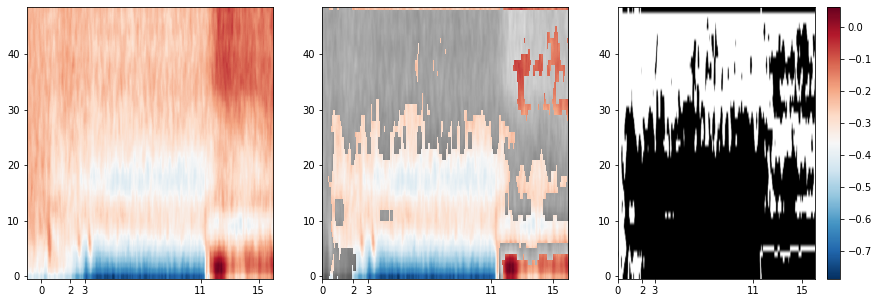

Loading: power2D_trials_AF3.pkl...


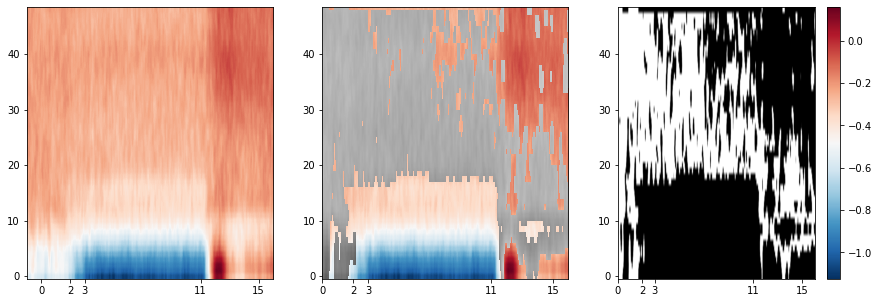

Loading: power2D_trials_P2.pkl...


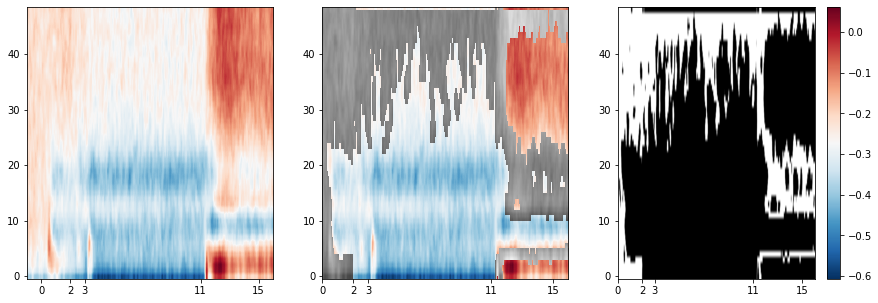

Loading: power2D_trials_P3.pkl...


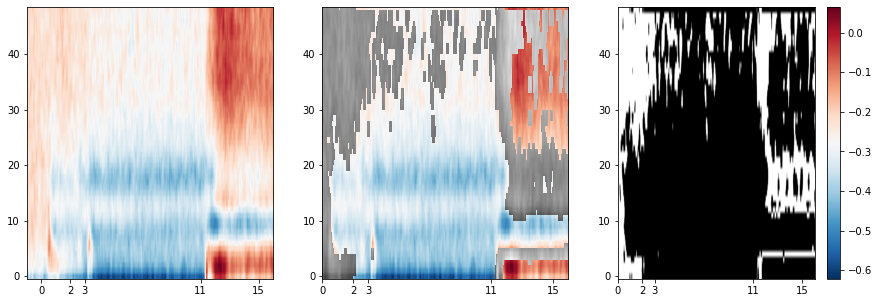

Loading: power2D_trials_P7.pkl...


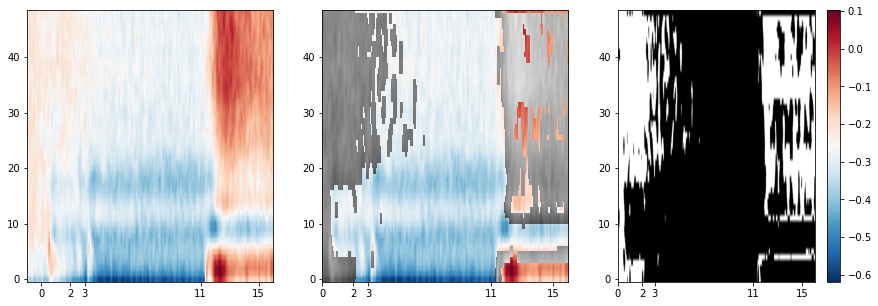

Loading: power2D_trials_Fz.pkl...


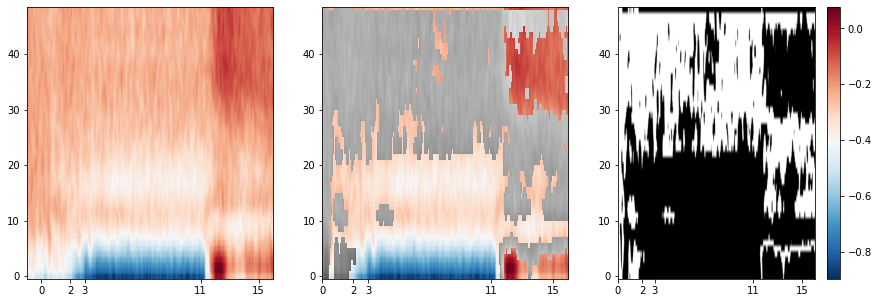

Loading: power2D_trials_P6.pkl...


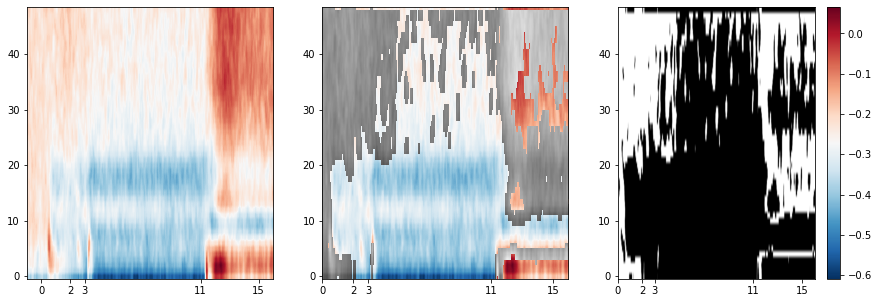

Loading: power2D_trials_AF7.pkl...


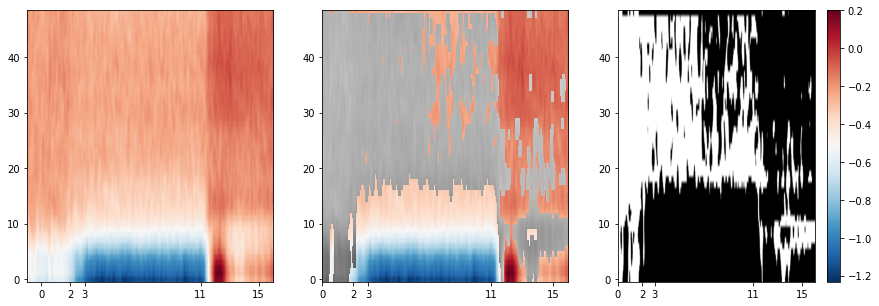

Loading: power2D_trials_TP7.pkl...


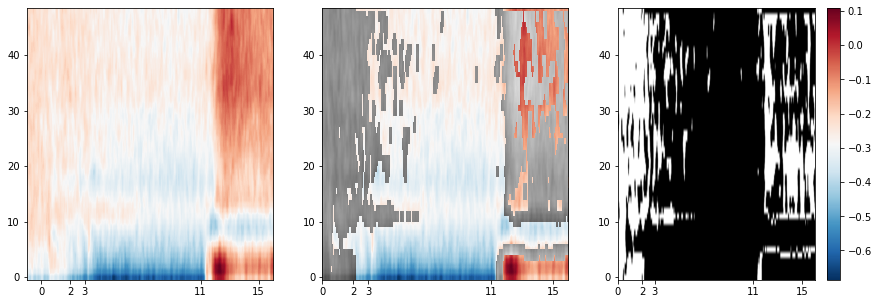

Loading: power2D_trials_P4.pkl...


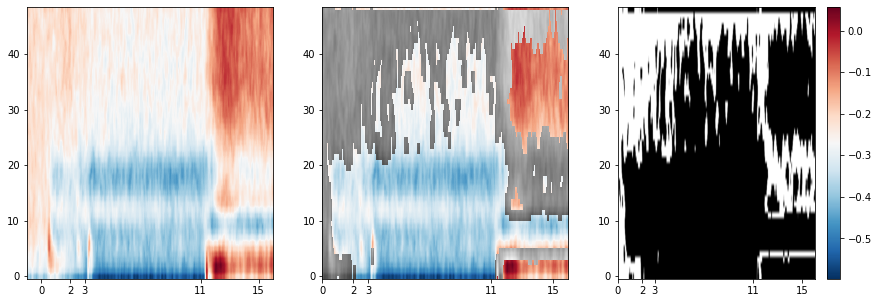

Loading: power2D_trials_F8.pkl...


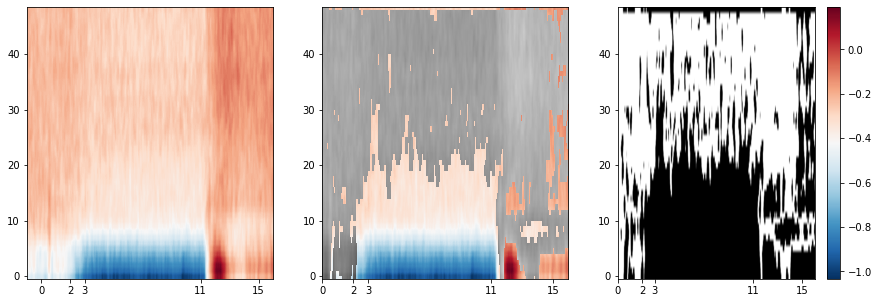

Loading: power2D_trials_P5.pkl...


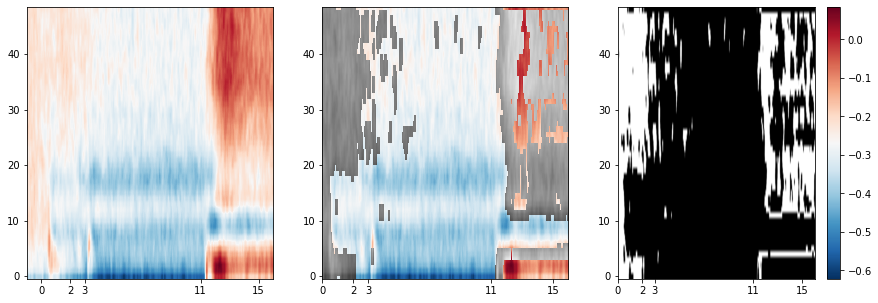

Loading: power2D_trials_FT7.pkl...


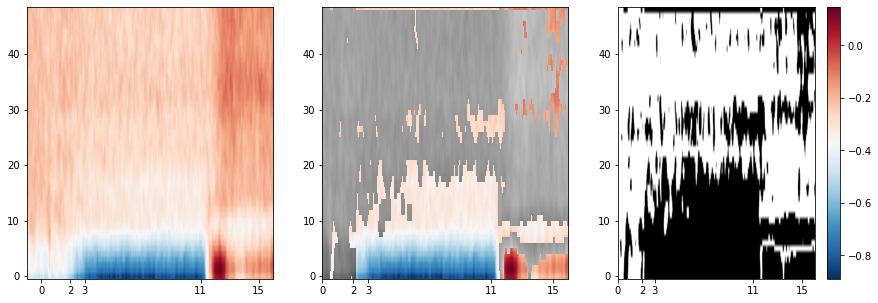

Loading: power2D_trials_CPz.pkl...


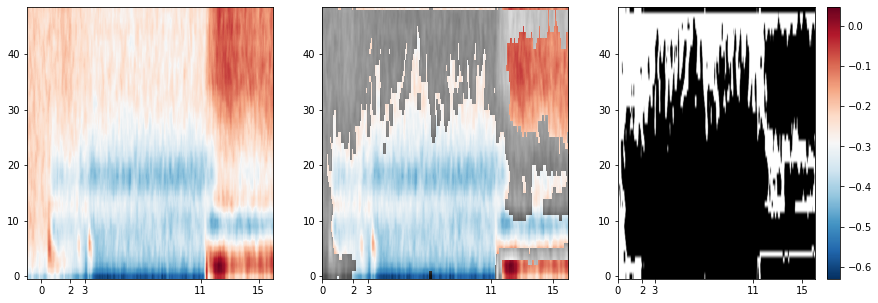

Loading: power2D_trials_AF4.pkl...


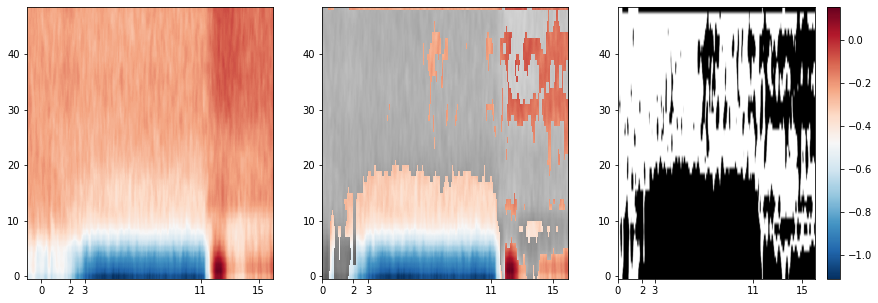

Loading: power2D_trials_C3.pkl...


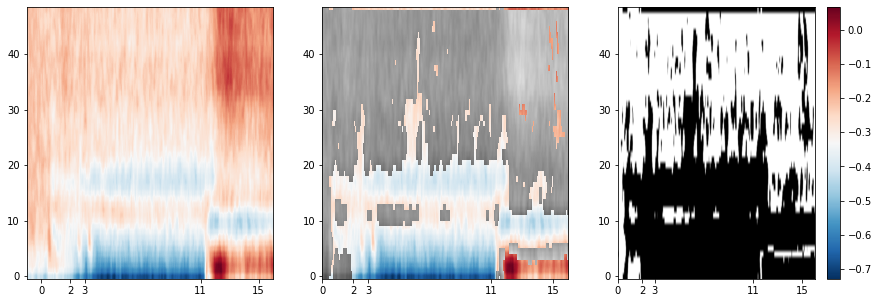

Loading: power2D_trials_PO7.pkl...


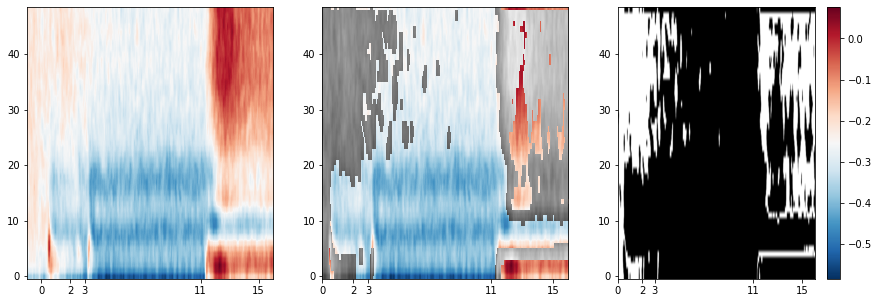

Loading: power2D_trials_O1.pkl...


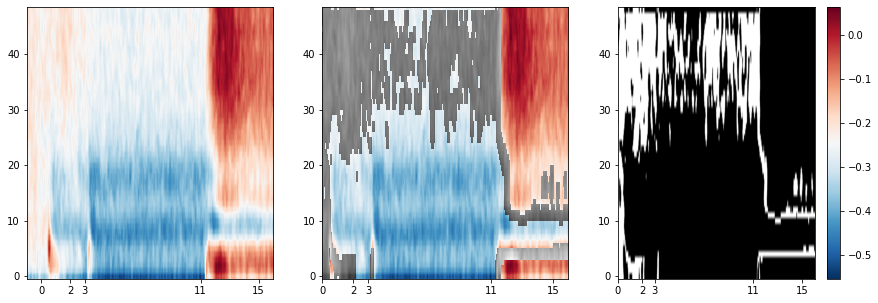

Loading: power2D_trials_C2.pkl...


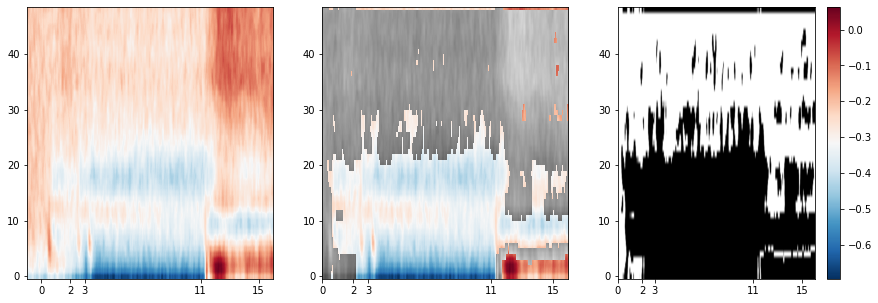

Loading: power2D_trials_Fpz.pkl...


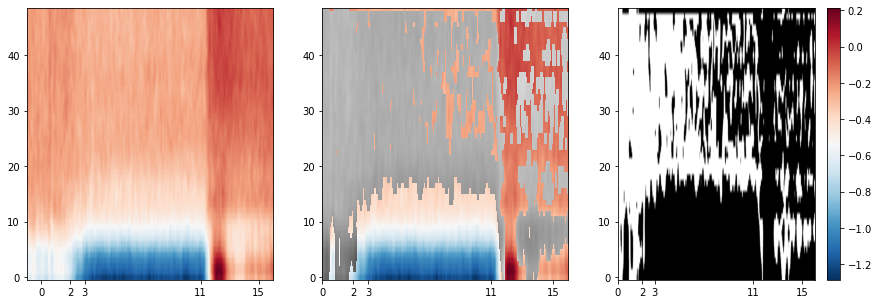

Loading: power2D_trials_PO4.pkl...


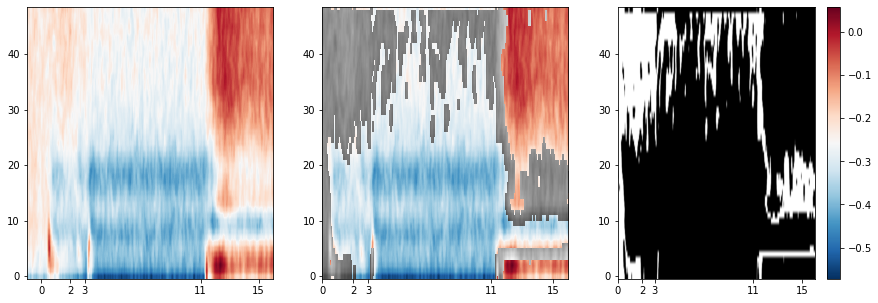

Loading: power2D_trials_O2.pkl...


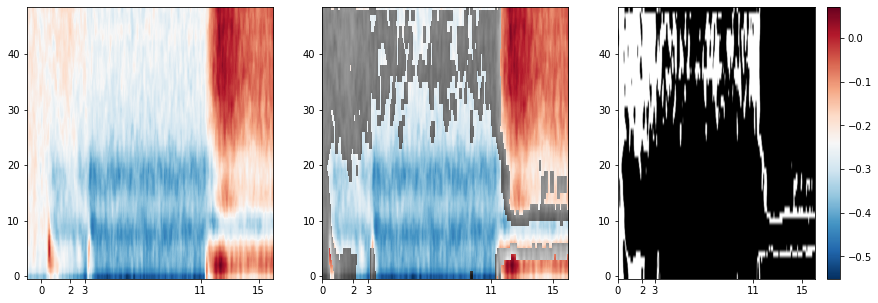

Loading: power2D_trials_C1.pkl...


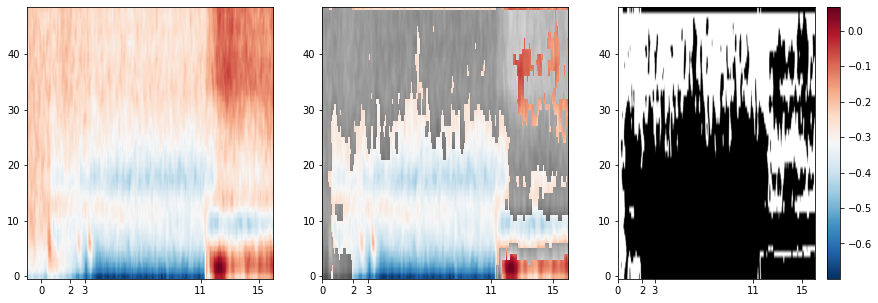

Loading: power2D_trials_T8.pkl...


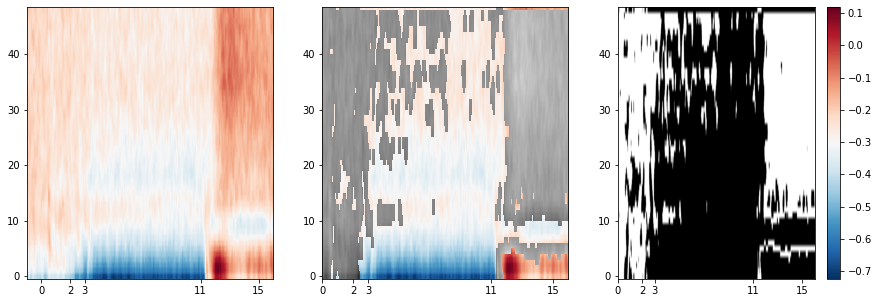

Loading: power2D_trials_C5.pkl...


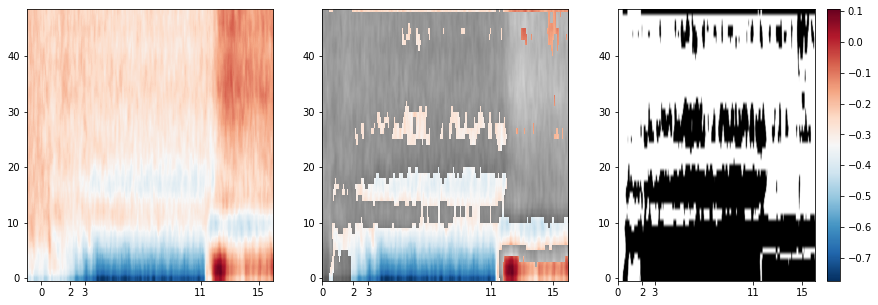

Loading: power2D_trials_C4.pkl...


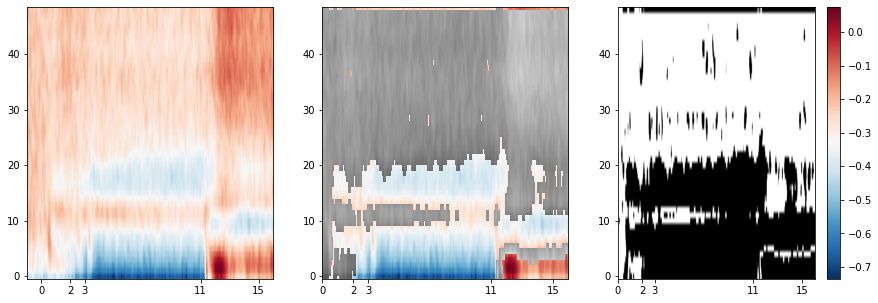

Loading: power2D_trials_C6.pkl...


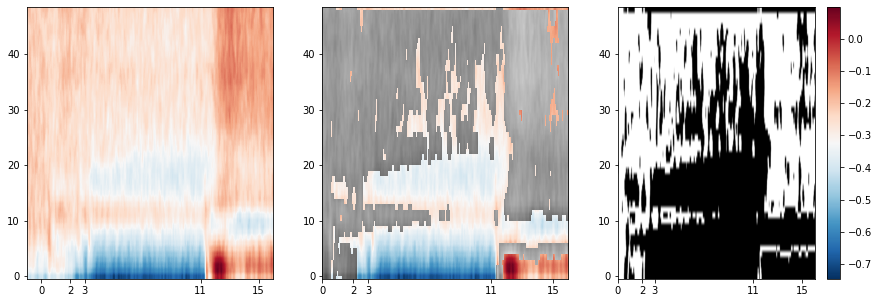

Loading: power2D_trials_PO3.pkl...


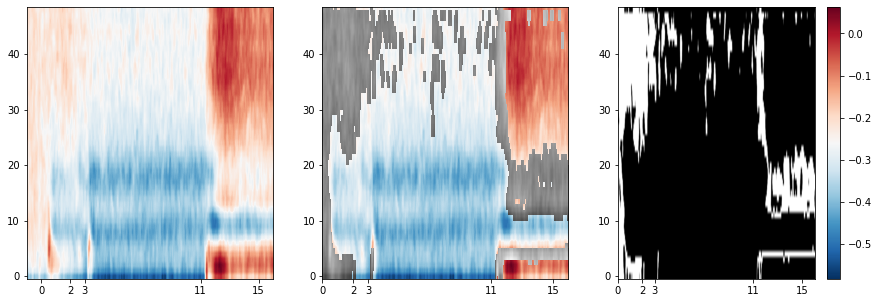

Loading: power2D_trials_Fp1.pkl...


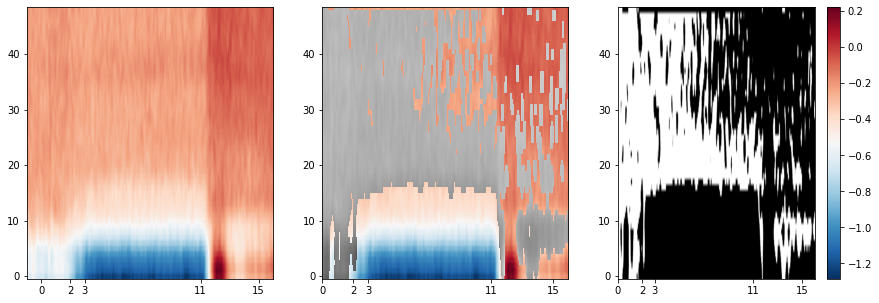

Loading: power2D_trials_Cz.pkl...


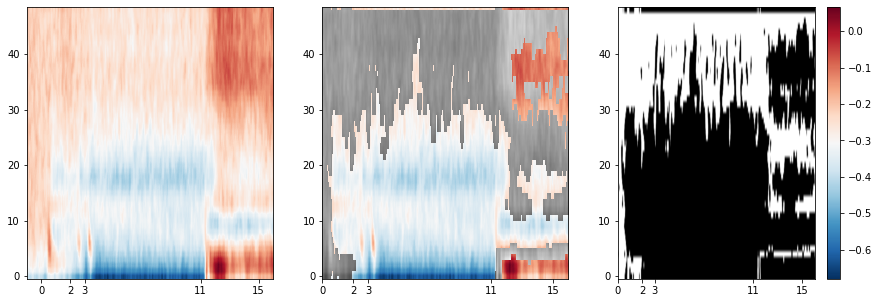

Loading: power2D_trials_Fp2.pkl...


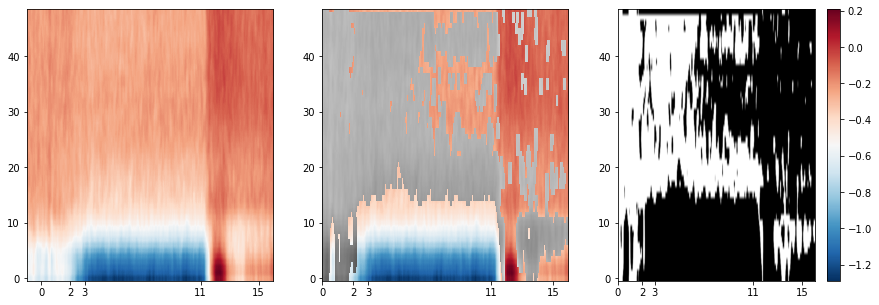

Loading: power2D_trials_Oz.pkl...


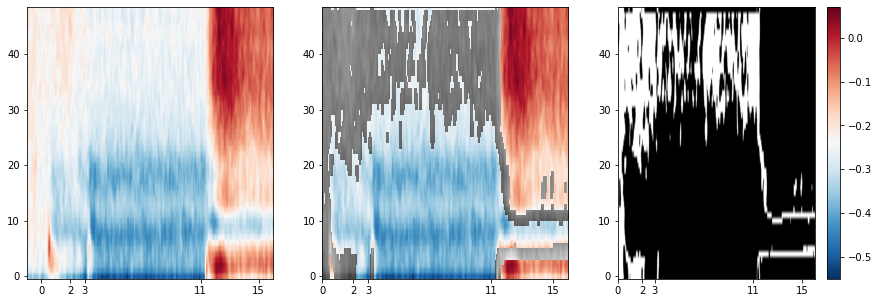

Loading: power2D_trials_PO8.pkl...


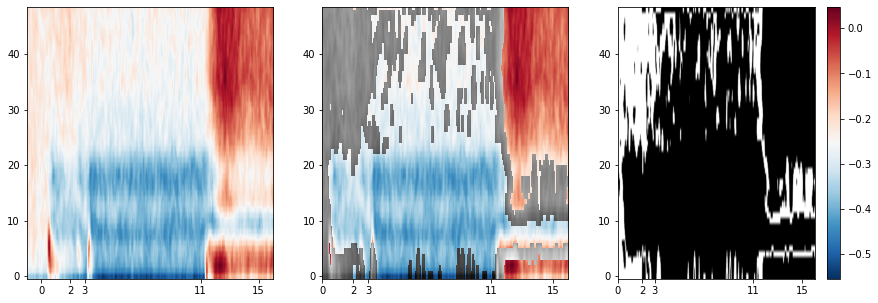

Loading: power2D_trials_POz.pkl...


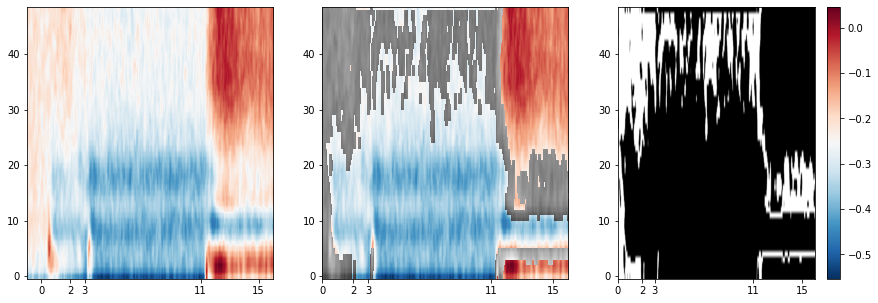

Loading: power2D_trials_T7.pkl...


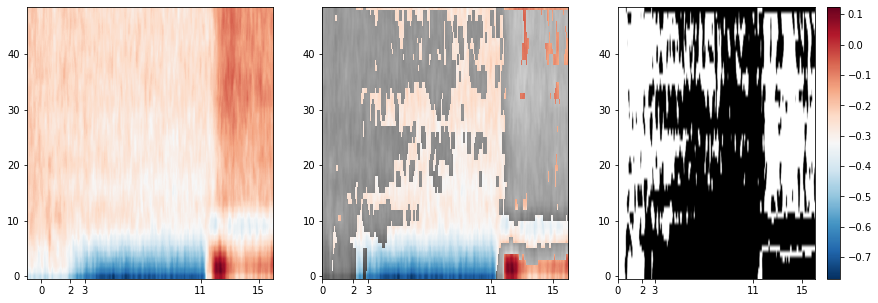

Loading: power2D_trials_FC3.pkl...


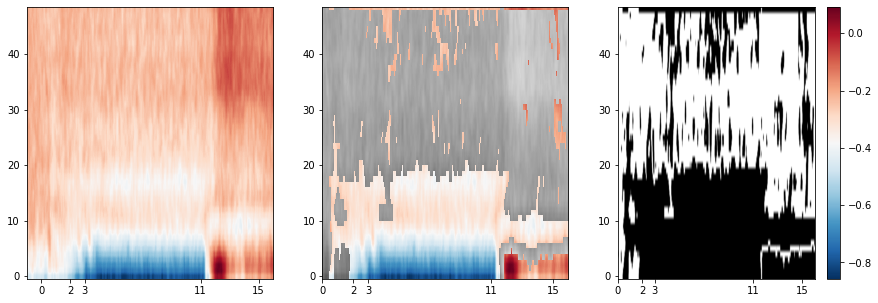

Loading: power2D_trials_CP6.pkl...


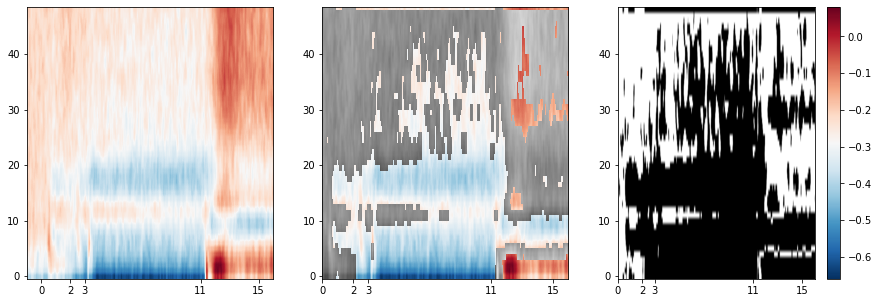

Loading: power2D_trials_P8.pkl...


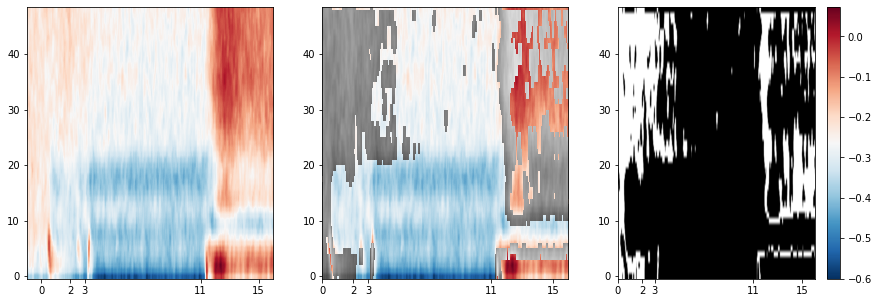

Loading: power2D_trials_F5.pkl...


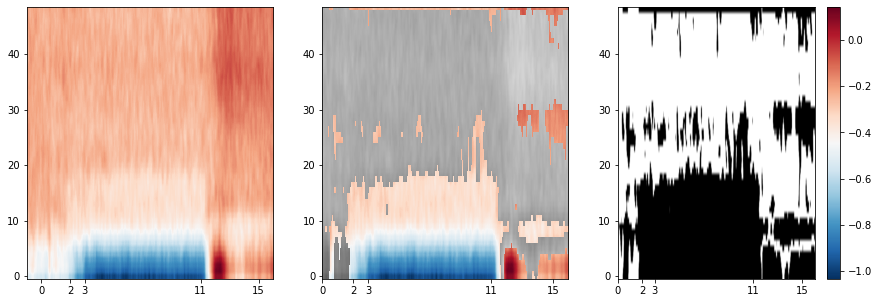

Loading: power2D_trials_Iz.pkl...


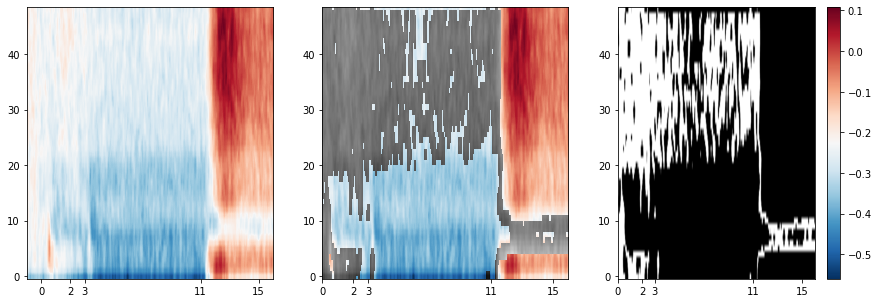

Loading: power2D_trials_P10.pkl...


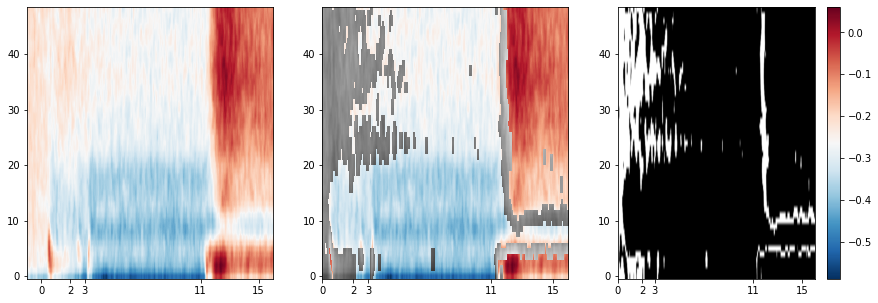

Loading: power2D_trials_F4.pkl...


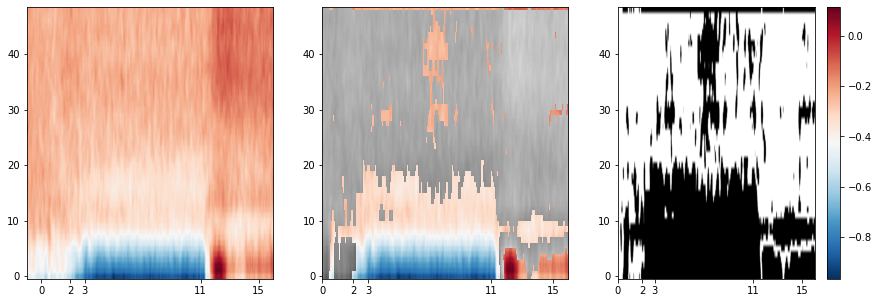

Loading: power2D_trials_P9.pkl...


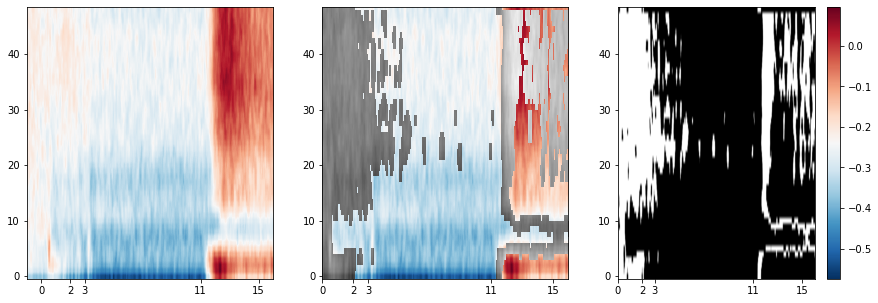

Loading: power2D_trials_FC2.pkl...


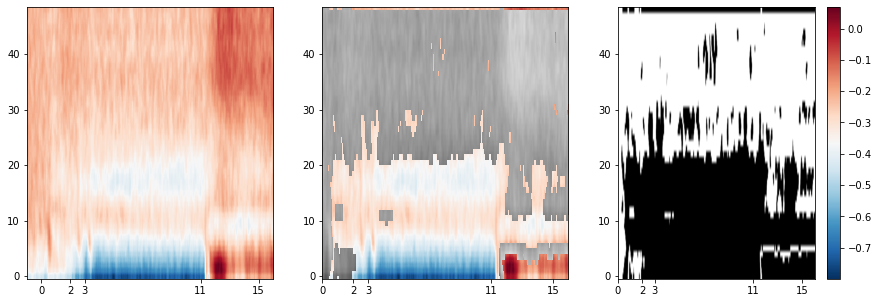

Loading: power2D_trials_AF8.pkl...


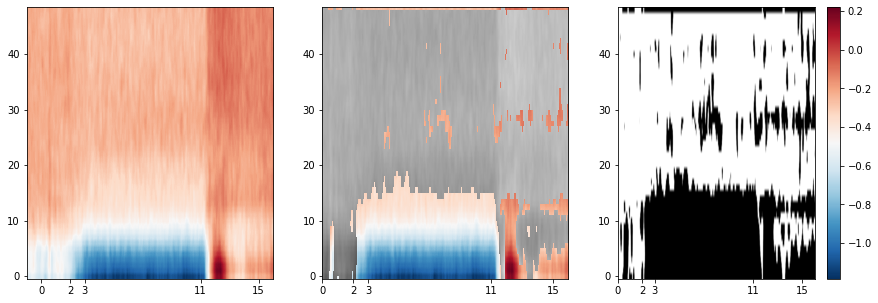

Loading: power2D_trials_TP8.pkl...


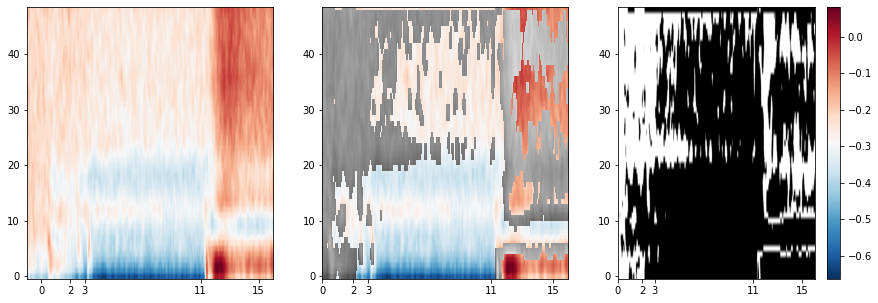

Loading: power2D_trials_CP5.pkl...


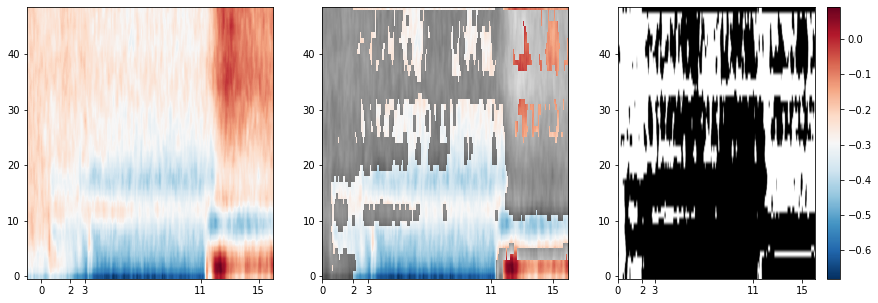

Loading: power2D_trials_Pz.pkl...


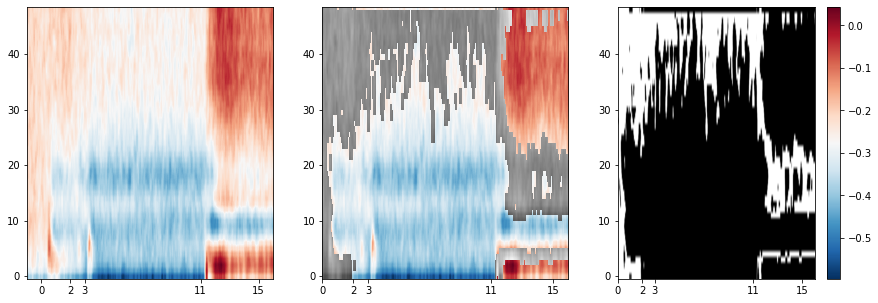

Loading: power2D_trials_F6.pkl...


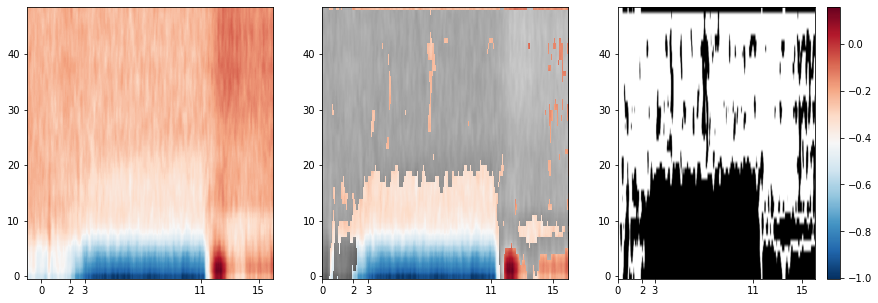

Loading: power2D_trials_F7.pkl...


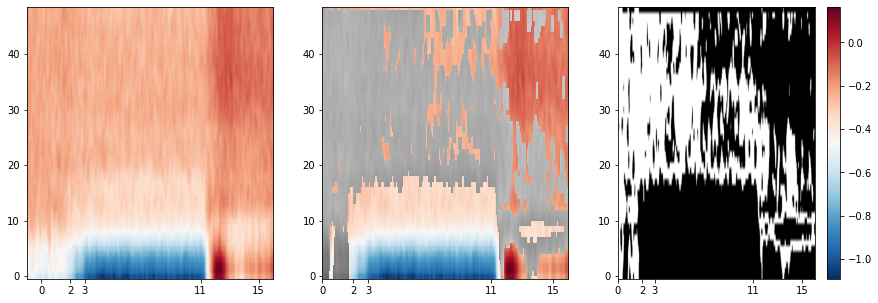

Loading: power2D_trials_FT8.pkl...


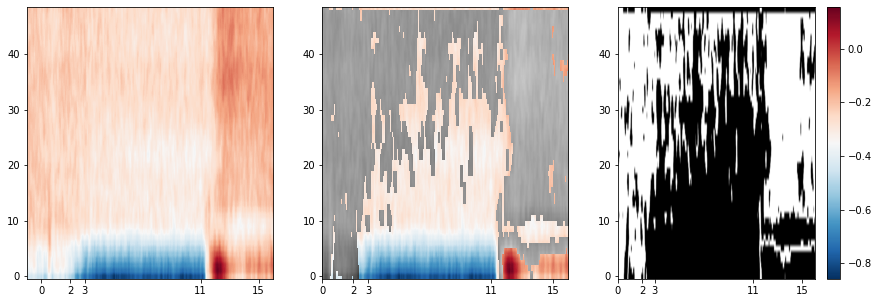

Loading: power2D_trials_CP4.pkl...


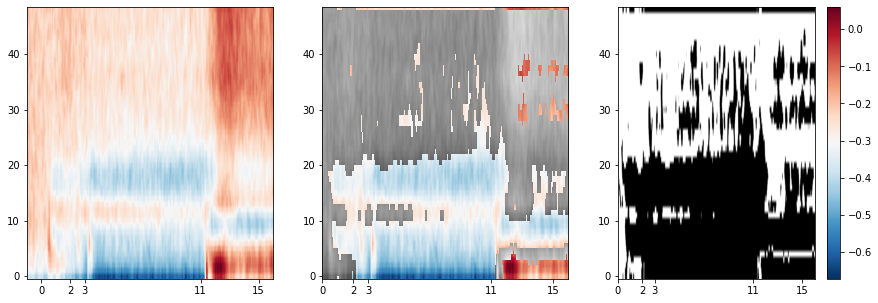

Loading: power2D_trials_FC1.pkl...


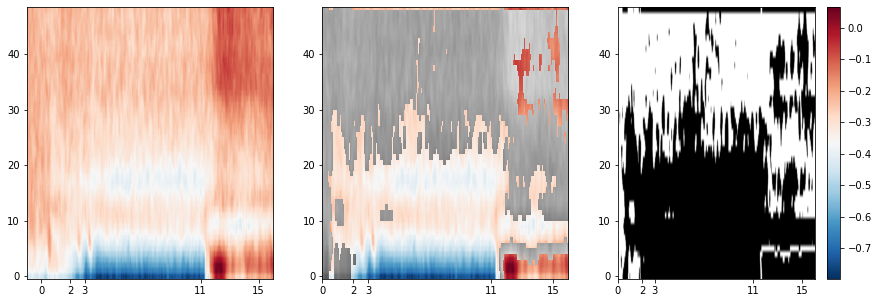

Loading: power2D_trials_AFz.pkl...


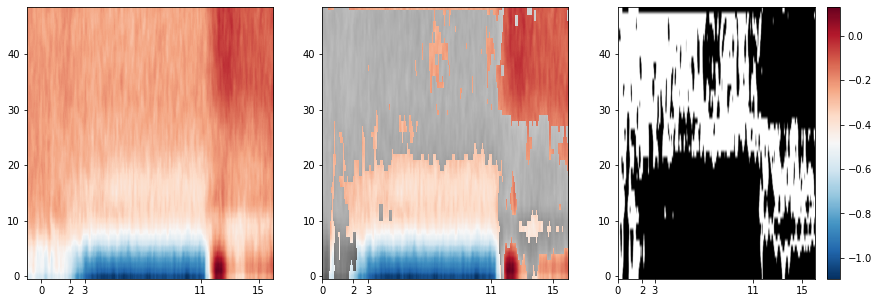

Loading: power2D_trials_FC5.pkl...


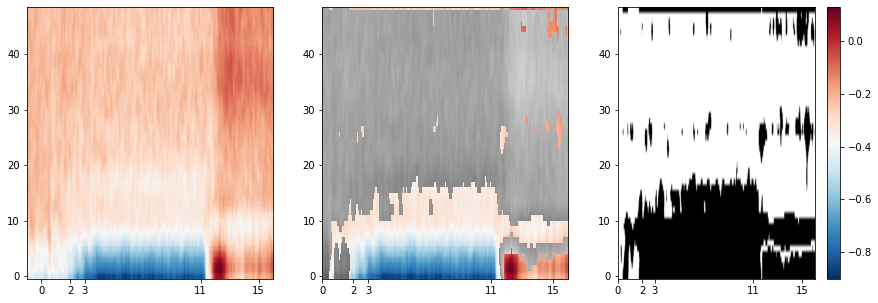

Loading: power2D_trials_F3.pkl...


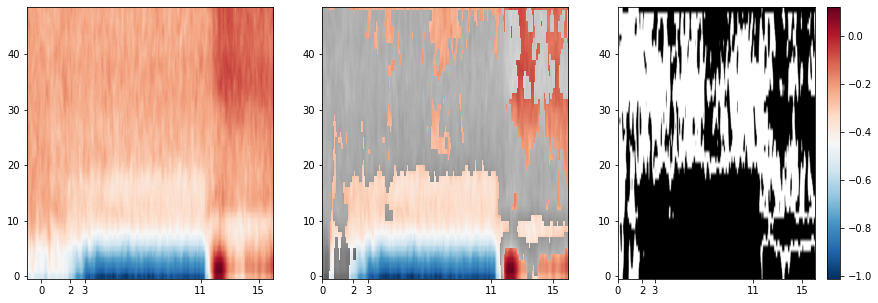

Loading: power2D_trials_F2.pkl...


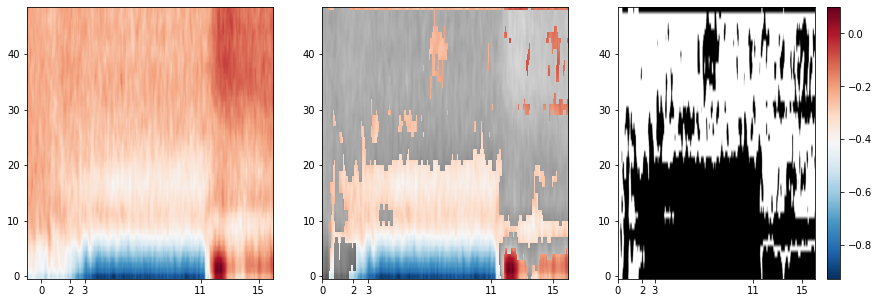

Loading: power2D_trials_CP1.pkl...


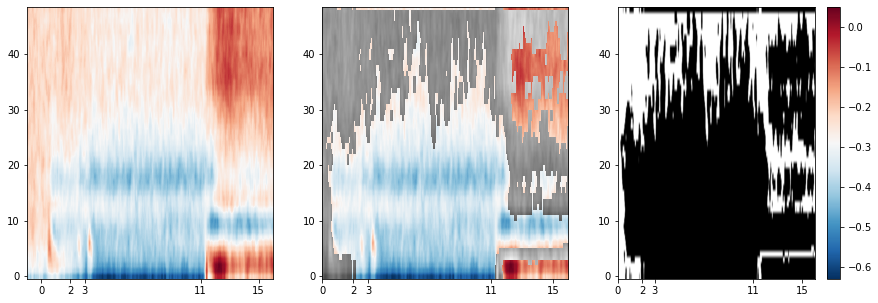

Loading: power2D_trials_FC4.pkl...


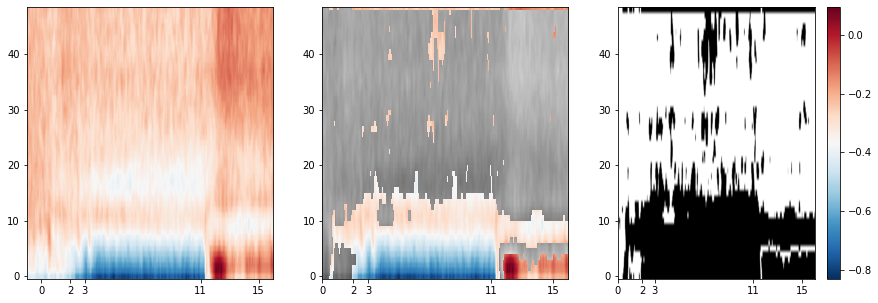

Loading: power2D_trials_FC6.pkl...


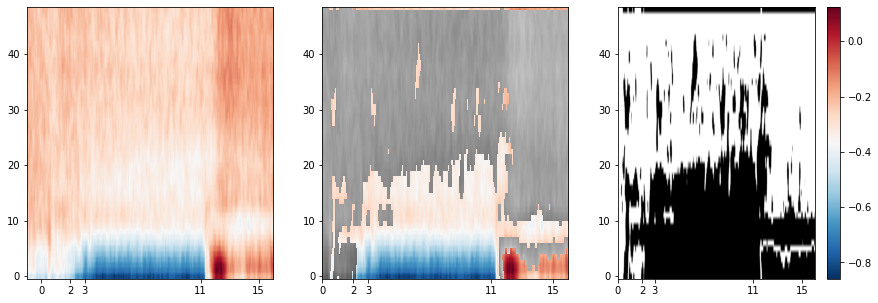

Loading: power2D_trials_CP3.pkl...


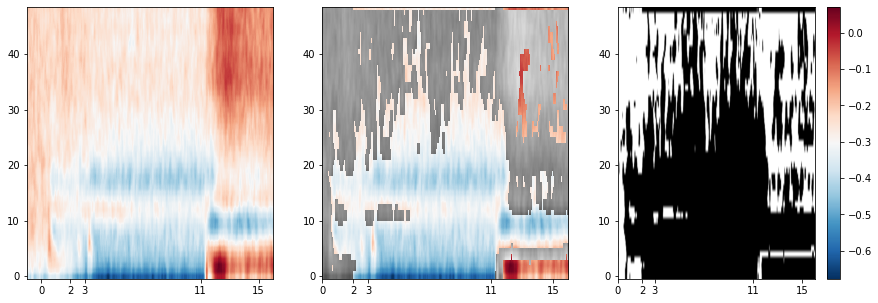

Loading: power2D_trials_F1.pkl...


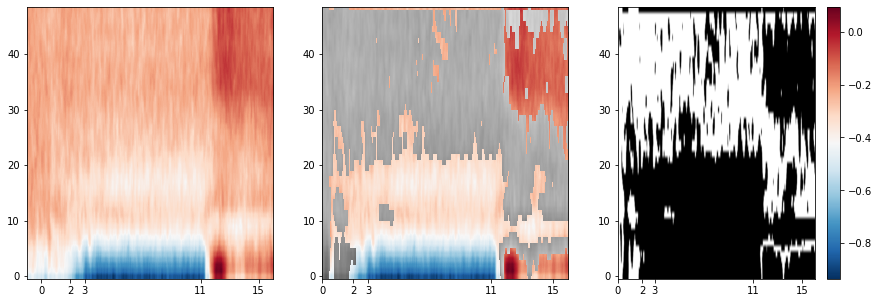

Loading: power2D_trials_CP2.pkl...


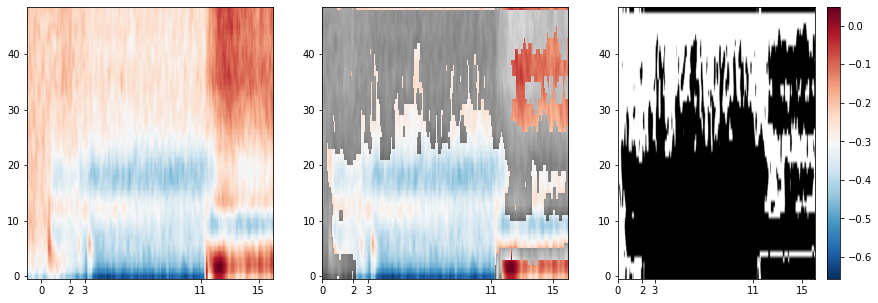

In [10]:
for filepath in glob.iglob(directory_path + 'power2D_trials_*.pkl'):
    filename = filepath[filepath.rfind('/')+1:]
    print(f'Loading: {filename}...')
    
    with open(filepath, "rb") as f:
        data_pickle = pickle.load(f)

        times = data_pickle["times"]
        pvals2D = data_pickle["power2D_pvals"]
        power2D_blratio = data_pickle['power2D_blratio_mean']
        
        pvals2D_bool = pvals2D.copy()
        pvals2D_bool[pvals2D < 0.05] = 0
        pvals2D_bool[pvals2D >= 0.05] = 1
        
        tpower2D = power2D_blratio[:,times>=0]
        tmask = tpower2D.copy()
        tmask[pvals2D >= 0.05] = np.nan
        
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        
        ticks_offset = np.where(times > -1)[0][0]
        times_of_interest = [0, 2, 3, 11, 15]
        ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]
        y = axs[0].imshow(power2D_blratio, cmap='RdBu_r', aspect='auto', origin='lower')
        axs[0].set_xticks(ticks_of_interest)
        axs[0].set_xticklabels(times_of_interest)
        plt.colorbar(y)
        
        ticks_offset = np.where(times > 0)[0][0]
        times_of_interest = [0, 2, 3, 11, 15]
        ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]
        axs[1].imshow(tpower2D, cmap=plt.cm.gray, aspect='auto', origin='lower')
        axs[1].imshow(tmask, cmap=plt.cm.RdBu_r, aspect='auto', origin='lower')
        axs[1].set_xticks(ticks_of_interest)
        axs[1].set_xticklabels(times_of_interest)
        
        ticks_offset = np.where(times > 0)[0][0]
        times_of_interest = [0, 2, 3, 11, 15]
        ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]
        axs[2].imshow(pvals2D_bool, cmap=plt.cm.gray, aspect='auto', origin='lower')
        axs[2].set_xticks(ticks_of_interest)
        axs[2].set_xticklabels(times_of_interest)
        
        plt.show()
        

No baseline correction applied


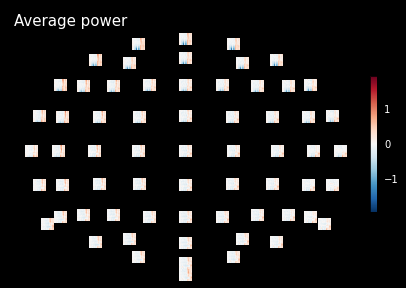

In [15]:
fig = power.plot_topo(title='Average power')
fig.savefig('power_topo.png', dpi=300, format='png')

In [69]:
with open("./Subject_F12F2_cleanAR.pkl", "rb") as f:
    data_pickle = pickle.load(f)
    
epochs = data_pickle['epochs']
raw = data_pickle['raw']
events = data_pickle['events']

epochs

Number of events,70
Events,1/classicmod/bad: 41/classicmod/good: 31/left/bad: 51/left/good: 31/right/good: 62/classicmod/bad: 12/classicmod/good: 62/left/bad: 62/left/good: 42/right/bad: 22/right/good: 53/classicmod/bad: 13/classicmod/good: 63/left/bad: 43/left/good: 53/right/bad: 63/right/good: 3
Time range,-3.000 – 20.000 sec
Baseline,-3.000 – 20.000 sec


In [70]:
decim = 3
freqs = np.arange(2, 40, 2)  # define frequencies of interest
sfreq = raw.info['sfreq']  # sampling in Hz
n_cycles = freqs/2.
power = tfr_morlet(epochs, freqs, n_cycles=n_cycles, decim=decim, average=False, use_fft=True, return_itc=False, n_jobs=5)
#power.apply_baseline(mode='logratio', baseline=(-1, 0))

[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  13 tasks      | elapsed:    8.7s
[Parallel(n_jobs=5)]: Done  64 out of  64 | elapsed:   30.1s finished


Not setting metadata


Loading: power2D_trials_Fpz.pkl...
Loading: power2D_trials_AFz.pkl...
Loading: power2D_trials_Fz.pkl...
Loading: power2D_trials_FCz.pkl...
Loading: power2D_trials_Cz.pkl...
Loading: power2D_trials_CPz.pkl...
Loading: power2D_trials_Pz.pkl...
Loading: power2D_trials_POz.pkl...
Loading: power2D_trials_Oz.pkl...


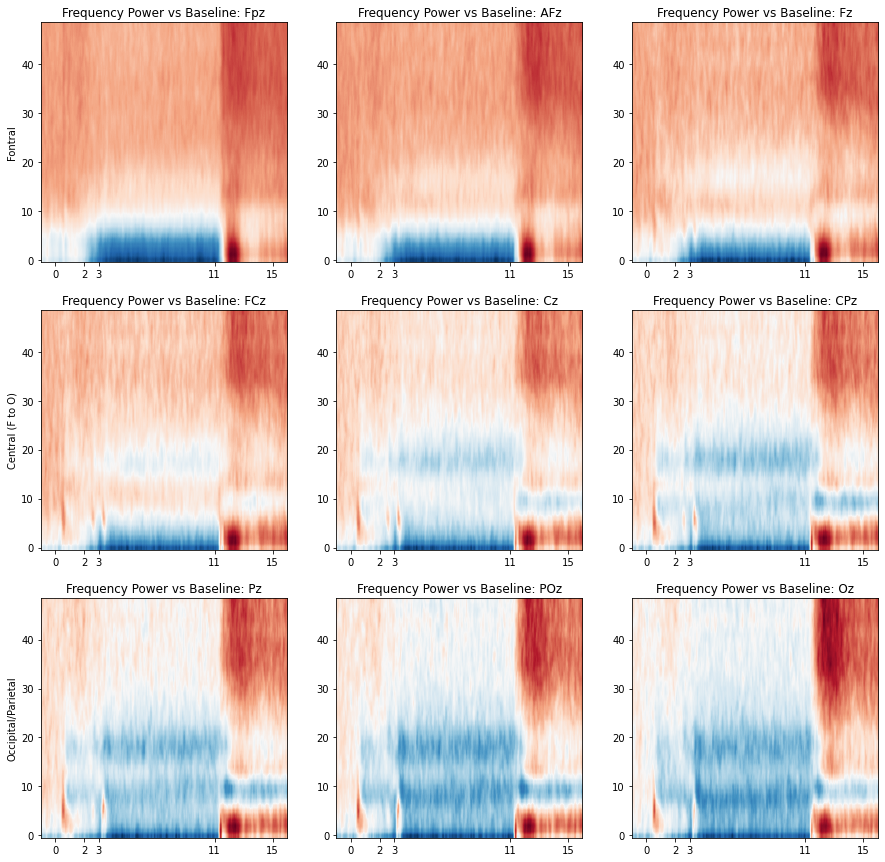

In [44]:
mid_channels = [['Fpz', 'AFz', 'Fz'],['FCz', 'Cz', 'CPz'],['Pz', 'POz', 'Oz']]
ylabel = ['Fontral', 'Central (F to O)', 'Occipital/Parietal']

fig, axs = plt.subplots(3,3, figsize=(15,15))

for i,cl in enumerate(mid_channels):
    for j,ch in enumerate(cl):
        filepath = directory_path + f'power2D_trials_{ch}.pkl'
        filename = filepath[filepath.rfind('/')+1:]
        print(f'Loading: {filename}...')

        with open(filepath, "rb") as f:
            data_pickle = pickle.load(f)

            times = data_pickle["times"]
            power2D_blratio = data_pickle['power2D_blratio_mean']

            ticks_offset = np.where(times > -1)[0][0]
            times_of_interest = [0, 2, 3, 11, 15]
            ticks_of_interest = [(np.where(times >= t)[0][0] - ticks_offset) for t in times_of_interest]
            y = axs[i,j].imshow(power2D_blratio, cmap='RdBu_r', aspect='auto', origin='lower')
            axs[i,j].set_xticks(ticks_of_interest)
            axs[i,j].set_xticklabels(times_of_interest)
            axs[i,j].set_title(f'Frequency Power vs Baseline: {ch}')
            #plt.colorbar(y)
    axs[i, 0].set_ylabel(ylabel[i])
    
plt.show()

fig.savefig('3D-MOT_MidLine_Power.png', dpi=300, format='png')